<a href="https://colab.research.google.com/github/c-etulle/Vegetation-dynamics-in-the-Subandean-grasslands-of-Chubut/blob/main/9_Subandean_grassland_V11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set-Up

In [ ]:
import os, sys
from google.colab import drive
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats # For linear regression and correlation coefficients
import plotly.graph_objects as go # For interactive plots

# Set working directory
drive.mount('/content/drive')
%cd /content/drive/My\ Drive/ee-meinzinger-patagonia

# Plot settings

In [ ]:
# Settings needed to export the text as actual text in pdf files
from matplotlib import rcParams
# Set to embed fonts fully
rcParams['pdf.fonttype'] = 42  # Type 42 (TrueType fonts) keeps text as text
rcParams['ps.fonttype'] = 42  # Type 42 for PostScript output as well
rcParams['font.family'] = 'DejaVu Sans'

## Import df "Merged_data"

"Merged_data" contains all data dvs. LS, MODIS, SPEI and MARAS.

In [ ]:
# Change the working directory to the location of the .csv file
%cd /content/drive/My\ Drive/ee-meinzinger-patagonia/Data

# Load the CSV file into a pandas DataFrame
file_name = 'Merged_Data_20241005_1709.csv'
merged_data = pd.read_csv(file_name)

# Display data
merged_data.head()

/content/drive/My Drive/ee-meinzinger-patagonia/Data


,Site_Name,year_month,year,month,NDVI_Landsat,NDVI_MODIS,SPEI,Biozone,Country,Province,...,Patch_Silt,Patch_Sand,InterP_Con,InterP_pH,InterP_OC,InterP_N,InterP_OM,InterP_Clay,InterP_Silt,InterP_Sand
0,1 Rio Guenguel,2000_01,2000,1,0.04255,NaN,-1.202183,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1 Rio Guenguel,2000_02,2000,2,0.04015,0.14080,-0.862369,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1 Rio Guenguel,2000_03,2000,3,0.03890,0.13175,-0.742418,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1 Rio Guenguel,2000_04,2000,4,0.04640,0.14920,-0.189822,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1 Rio Guenguel,2000_05,2000,5,NaN,0.13650,-0.093864,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Add season and differenced NDVI

In [ ]:
# Define the dry seasons (Dec to Mar) by adjusting the "season" based on the "month"
merged_data["season"] = np.where(
    merged_data["month"] > 3,
    merged_data["year"] + 1,
    merged_data["year"]
)

# Apply the diff function to each site name
# The first value will be 0
merged_data['NDVI_Landsat_diff'] = (
    merged_data.groupby('Site_Name')['NDVI_Landsat']
    .diff()        # Calculate the difference within each group
 #   .fillna(0)     # Replace NaN with 0
)

merged_data.head()

,Site_Name,year_month,year,month,NDVI_Landsat,NDVI_MODIS,SPEI,Biozone,Country,Province,...,InterP_Con,InterP_pH,InterP_OC,InterP_N,InterP_OM,InterP_Clay,InterP_Silt,InterP_Sand,season,NDVI_Landsat_diff
0,1 Rio Guenguel,2000_01,2000,1,0.04255,NaN,-1.202183,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,NaN
1,1 Rio Guenguel,2000_02,2000,2,0.04015,0.14080,-0.862369,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,-0.00240
2,1 Rio Guenguel,2000_03,2000,3,0.03890,0.13175,-0.742418,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,-0.00125
3,1 Rio Guenguel,2000_04,2000,4,0.04640,0.14920,-0.189822,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001,0.00750
4,1 Rio Guenguel,2000_05,2000,5,NaN,0.13650,-0.093864,West Plateaus Shrublands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001,NaN


## Extract only Subandean grassland (SG)

In [ ]:
# Filter the DataFrame for "Subandean grasslands" in the "Biozone" column
subandean_grasslands = merged_data[merged_data['Biozone'] == 'Subandean grasslands']

# Display the filtered DataFrame
subandean_grasslands.head()

,Site_Name,year_month,year,month,NDVI_Landsat,NDVI_MODIS,SPEI,Biozone,Country,Province,...,InterP_Con,InterP_pH,InterP_OC,InterP_N,InterP_OM,InterP_Clay,InterP_Silt,InterP_Sand,season,NDVI_Landsat_diff
2100,Alto Rio Mayo,2000_01,2000,1,0.0792,NaN,-1.531504,Subandean grasslands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,NaN
2101,Alto Rio Mayo,2000_02,2000,2,NaN,0.2144,-1.394958,Subandean grasslands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,NaN
2102,Alto Rio Mayo,2000_03,2000,3,0.0641,0.2217,-1.075082,Subandean grasslands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,NaN
2103,Alto Rio Mayo,2000_04,2000,4,0.0629,0.2194,-0.491075,Subandean grasslands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001,-0.0012
2104,Alto Rio Mayo,2000_05,2000,5,NaN,0.2504,-0.694021,Subandean grasslands,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001,NaN


### SPEI - Figure 9 PDF

Monthly SPEI only for Subandean grassland (2000 - 2024).

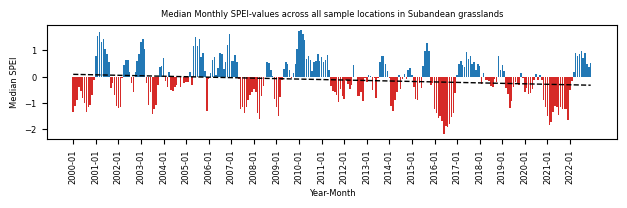

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/SPEI_barplot/All_sample_SPEI_Barplot.pdf
Slope per month: -0.0015
Intercept: 0.087
R-value: -0.15
P-value of the slope: 0.016
Standard error: 0.00062
Slope per year: -0.018


In [ ]:
# Define the folder to save the plots
save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/SPEI_barplot'
file_path = os.path.join(save_path, f"All_sample_SPEI_Barplot.pdf")

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Step 1: Calculate the median SPEI value per month across all sample locations
median_spei_per_month = (
    subandean_grasslands
    .groupby(["year", "month"])["SPEI"]
    .median()
    .reset_index()
)

# Step 1.1: Drop rows with NaN values in the 'SPEI' column and make a copy
non_na_spei = median_spei_per_month.dropna(subset=["SPEI"]).copy()

# Step 2: Combine 'year' and 'month' into a single 'year_month' column for plotting
non_na_spei["year_month"] = (
    non_na_spei["year"].astype(str) + "-" + non_na_spei["month"].astype(str).str.zfill(2)
)

# Step 3: Define colors based on the sign of the median SPEI value
colors = np.where(non_na_spei["SPEI"] >= 0, '#2278B5', '#D62A28')

# Step 4: Create the plot with a larger figure size for better spacing
fig, ax = plt.subplots(figsize=(2.9/2.54*5, 2.9/2.54))

# Step 4.1: Plot the bar chart with colors for positive and negative SPEI values
ax.bar(non_na_spei["year_month"], non_na_spei["SPEI"], color=colors)

# Step 5: Calculate the trendline using linear regression
x_numeric = np.arange(len(non_na_spei["SPEI"]))  # Convert x values to numerical range
y_values = non_na_spei["SPEI"].values
slope, intercept, r_value, p_value, std_err = stats.linregress(x_numeric, y_values)

# Step 5.1: Compute the trendline values
trend_line = slope * x_numeric + intercept

# Step 6: Plot the trendline
ax.plot(
    non_na_spei["year_month"],
    trend_line,
    color='black',
    linestyle='--',
    linewidth=1,
    label='Trendline'
)

# Step 7: Set labels and title with appropriate font sizes
ax.set_xlabel("Year-Month", fontsize=6)
ax.set_ylabel("Median SPEI", fontsize=6)
ax.set_title("Median Monthly SPEI-values across all sample locations in Subandean grasslands", fontsize=6)
ax.tick_params(axis='y', labelsize=6)

# Step 7.1: Rotate x-axis labels and reduce their frequency for readability
plt.xticks(
    ticks=np.arange(0, len(non_na_spei), step=12),  # Show every 12th month
    labels=non_na_spei["year_month"].iloc[::12],
    rotation=90,
    ha='center',
    fontsize=6
)

# Step 7: Remove extra space, explicitly set axes position
ax.set_position([0, 0, 1, 1])  # Fill the entire figure area

# Save plot
plt.show()
fig.savefig(file_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0)
plt.close(fig)
print(f"Figure saved to {file_path}")

# Print statistical details of the trendline
print(f"Slope per month: {slope:.2g}")
print(f"Intercept: {intercept:.2g}")
print(f"R-value: {r_value:.2g}")
print(f"P-value of the slope: {p_value:.2g}")
print(f"Standard error: {std_err:.2g}")

# Calculate and print the slope per year
slope_per_year = slope * 12
print(f"Slope per year: {slope_per_year:.2g}")


Same as figure above - just interactive.

In [ ]:
# Step 1: Calculate the median SPEI value per month across all sample locations
median_spei_per_month = subandean_grasslands.groupby(["year", "month"])["SPEI"].median().reset_index()

# Drop NAs:
non_na_spei = median_spei_per_month.dropna(subset=["SPEI"])

# Step 2: Combine 'year' and 'month' into a single column for plotting
non_na_spei["year_month"] = non_na_spei["year"].astype(str) + "-" + non_na_spei["month"].astype(str).str.zfill(2)

# Step 3: Define colors based on the sign of the median SPEI value
colors = np.where(non_na_spei["SPEI"] >= 0, 'blue', 'red')

# Step 4: Convert x values to a numerical range for regression
x_numeric = np.arange(len(non_na_spei["SPEI"]))
y_values = non_na_spei["SPEI"].values

# Calculate the trendline using linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(x_numeric, y_values)
trend_line = slope * x_numeric + intercept

# Step 5: Create an interactive Plotly bar chart
fig = go.Figure()

# Add bars for SPEI values
fig.add_trace(go.Bar(
    x=non_na_spei["year_month"],
    y=non_na_spei["SPEI"],
    marker_color=colors,
    text=[f"{ym}<br>SPEI: {spei:.2f}" for ym, spei in zip(non_na_spei["year_month"], non_na_spei["SPEI"])],
    hoverinfo="text",  # Use custom hover text
    name="SPEI"
))

# Add the trendline
fig.add_trace(go.Scatter(
    x=non_na_spei["year_month"],
    y=trend_line,
    mode='lines',
    line=dict(color='black', dash='dash'),
    name="Trendline"
))

# Step 6: Customize layout
fig.update_layout(
    title="Median Monthly SPEI-values across all sample locations in Subandean grasslands",
    xaxis_title="Year-Month",
    yaxis_title="Median SPEI",
    xaxis=dict(tickangle=45, tickmode='array', tickvals=non_na_spei["year_month"][::12]),
    legend=dict(x=0.01, y=0.99),
    height=600,
    width=1000
)

# Show the figure
fig.show()

# Step 7: Print the regression statistics
print("Slope per month:", f"{slope:.2g}")
print("Intercept:",  f"{intercept:.2g}")
print("R-value:",  f"{r_value:.2g}")
print("P-value of the slope:",  f"{p_value:.2g}")
print("Standard error:",  f"{std_err:.2g}")
slope_per_year = slope * 12
print("Slope per year:", f"{slope_per_year:.2g}")

<ipython-input-35-1e601d611b02>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_na_spei["year_month"] = non_na_spei["year"].astype(str) + "-" + non_na_spei["month"].astype(str).str.zfill(2)


Slope per month: -0.0015
Intercept: 0.087
R-value: -0.15
P-value of the slope: 0.016
Standard error: 0.00062
Slope per year: -0.018


#### Negative SPEI

Find the top three, most negative SPEI-months.

In [ ]:
# Step 1: Sort the dataframe by SPEI in ascending order (most negative values at the top)
top_negative_spei = non_na_spei.sort_values(by="SPEI").head(3)

# Step 2: Display the results
print("Top 3 months with the most negative SPEI values:")
print(top_negative_spei[["year", "month", "SPEI"]])

Top 3 months with the most negative SPEI values:
     year  month      SPEI
197  2016      6 -2.168685
199  2016      8 -1.914458
198  2016      7 -1.879969


Longest negative streak.

In [ ]:
# Step 1: Add a column indicating whether the SPEI value is negative
non_na_spei["is_negative"] = non_na_spei["SPEI"] < 0

# Step 2: Identify streaks of consecutive negative months
non_na_spei["streak_id"] = (non_na_spei["is_negative"] != non_na_spei["is_negative"].shift()).cumsum()

# Step 3: Filter only negative streaks
negative_streaks = non_na_spei[non_na_spei["is_negative"]]

# Step 4: Group by streak_id to count the length of each negative streak
streak_lengths = negative_streaks.groupby("streak_id").size()

# Step 5: Find the streak_id with the longest negative streak
longest_streak_id = streak_lengths.idxmax()
longest_streak_length = streak_lengths.max()

# Step 6: Extract the rows corresponding to the longest streak
longest_negative_streak = negative_streaks[negative_streaks["streak_id"] == longest_streak_id]

# Step 7: Get the time period (start and end date) of the longest streak
start_date = longest_negative_streak["year_month"].iloc[0]
end_date = longest_negative_streak["year_month"].iloc[-1]

# Display results
print(f"The longest streak of consecutive negative SPEI values lasted {longest_streak_length} months.")
print(f"Time period: {start_date} to {end_date}")


The longest streak of consecutive negative SPEI values lasted 17 months.
Time period: 2020-10 to 2022-02


<ipython-input-37-35dd24d8d294>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-37-35dd24d8d294>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Positive SPEI

Longest positive streak.

In [ ]:
# Step 1: Add a column to indicate whether SPEI is positive
non_na_spei["is_positive"] = non_na_spei["SPEI"] > 0

# Step 2: Create a column for consecutive positive streaks
non_na_spei["streak_id"] = (non_na_spei["is_positive"] != non_na_spei["is_positive"].shift()).cumsum()

# Step 3: Filter for positive streaks only
positive_streaks = non_na_spei[non_na_spei["is_positive"]]

# Step 4: Count the length of each streak
streak_lengths = positive_streaks.groupby("streak_id").size().reset_index(name="streak_length")

# Step 5: Find the longest streak
longest_streak_id = streak_lengths.loc[streak_lengths["streak_length"].idxmax(), "streak_id"]
longest_streak = positive_streaks[positive_streaks["streak_id"] == longest_streak_id]

# Step 6: Extract the time period
start_date = longest_streak.iloc[0]["year_month"]
end_date = longest_streak.iloc[-1]["year_month"]

# Step 7: Display the result
print(f"Longest continuous positive SPEI streak:")
print(f"Start: {start_date}, End: {end_date}")
print(f"Number of months: {len(longest_streak)}")


Longest continuous positive SPEI streak:
Start: 2009-10, End: 2011-05
Number of months: 20


<ipython-input-38-8caa517f543f>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-38-8caa517f543f>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Find top three, most positive SPEI-months.

In [ ]:
# Step 1: Sort the data by SPEI in descending order
top_positive_spei = non_na_spei.sort_values(by="SPEI", ascending=False)

# Step 2: Select the top 3 rows with the highest SPEI values
top_3_positive_spei = top_positive_spei.head(3)

# Step 3: Display the result
print("Top 3 maximum positive SPEI values:")
print(top_3_positive_spei[["year", "month", "SPEI"]])

Top 3 maximum positive SPEI values:
     year  month      SPEI
121  2010      2  1.761725
120  2010      1  1.718947
14   2001      3  1.708514


### NDVI (Figure 6)

Monthly NDVI only for Subandean grassland (2000 - 2024).

<ipython-input-40-7240268f00bc>:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



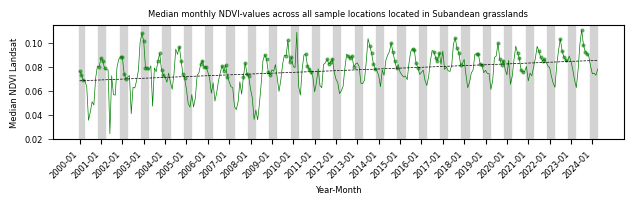

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/NDVI_plots/NDVI_timeline.pdf
Slope per month: 5.9e-05
Intercept: 0.068
R-value: 0.36
P-value of the slope: 2.4e-10
Standard error: 9e-06
Slope per year: 0.00071


In [ ]:
# Define the folder to save the plots
save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/NDVI_plots/'
file_path = os.path.join(save_path, f"NDVI_timeline.pdf")

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)


# Step 1: Calculate the median NDVI_Landsat value per month across all sample locations
median_ndvi_per_month = subandean_grasslands.groupby(["year", "month"])["NDVI_Landsat"].median().reset_index()

# Drop NAs:
non_na_ndvi_per_month = median_ndvi_per_month.dropna(subset=["NDVI_Landsat"])

# Step 2: Combine 'year' and 'month' into a single column for plotting
non_na_ndvi_per_month["year_month"] = non_na_ndvi_per_month["year"].astype(str) + "-" + non_na_ndvi_per_month["month"].astype(str).str.zfill(2)

# Step 3: Create the plot
fig, ax = plt.subplots(figsize=(2.9/2.54*5, 2.9/2.54))

# Plot the median NDVI_Landsat values as a green line
ax.plot(non_na_ndvi_per_month["year_month"], non_na_ndvi_per_month["NDVI_Landsat"],
        color='green', linestyle='-', label='Median NDVI_Landsat',
        linewidth = 0.5,)

# Plot only the dots of months 12, 1, 2 and 3
ax.plot(non_na_ndvi_per_month["year_month"][non_na_ndvi_per_month["month"].isin([12, 1, 2, 3])],
        non_na_ndvi_per_month["NDVI_Landsat"][non_na_ndvi_per_month["month"].isin([12, 1, 2, 3])],
        color='green', marker='o',label='Median NDVI_Landsat',
        markersize = 2, alpha = 0.5, linewidth = 0)

# Step 4: Set labels and title
ax.set_xlabel("Year-Month", fontsize=6)
ax.set_ylabel("Median NDVI Landsat", fontsize=6)
ax.set_title("Median monthly NDVI-values across all sample locations located in Subandean grasslands", fontsize=6)

# Step 5: Calculate the trendline using linear regression
# Convert x values to a numerical range for regression (0, 1, 2, ...)
x_numeric = np.arange(len(non_na_ndvi_per_month["NDVI_Landsat"]))
y_values = non_na_ndvi_per_month["NDVI_Landsat"].values
slope, intercept, r_value, p_value, std_err = stats.linregress(x_numeric, y_values)
trend_line = slope * x_numeric + intercept

# Step 6: Plot the trendline
ax.plot(non_na_ndvi_per_month["year_month"], trend_line, color='black',
        linestyle='--', linewidth=0.5, label='Trendline')

# Add gray background for December to March (dry season)
for i, row in non_na_ndvi_per_month.iterrows():
    if row["month"] in [12, 1, 2, 3]:  # Months: December to March
        ax.axvspan(i - 0.5, i + 0.5, color='lightgray', alpha=1)  # Highlight the background

# Filter for only January months to display on x-axis for better comparability
january_indices = non_na_ndvi_per_month[non_na_ndvi_per_month["month"] == 1].index
january_labels = non_na_ndvi_per_month.loc[january_indices, "year_month"]

# Rotate x-axis labels and display only January months
plt.xticks(ticks=january_indices,
           labels=january_labels,
           rotation=45, ha='right', fontsize=6)


# Set y-ticks label size
ax.tick_params(axis='y', labelsize = 6, width = 0.5)

# Remove extra space: explicitly set axes position
ax.set_position([0, 0, 1, 1])  # Fill the entire figure area

# Save plot
plt.show()
fig.savefig(file_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0)
plt.close(fig)
print(f"Figure saved to {file_path}")

# Print the slope, intercept, p-value, and standard error
print("Slope per month:", f"{slope:.2g}")
print("Intercept:",  f"{intercept:.2g}")
print("R-value:",  f"{r_value:.2g}")
print("P-value of the slope:",  f"{p_value:.2g}")
print("Standard error:",  f"{std_err:.2g}")
slope_per_year = slope * 12
print("Slope per year:", f"{slope_per_year:.2g}")

Identify range of NDVI-values.

In [ ]:
# Step 1: Calculate the median NDVI_Landsat value per month across all sample locations
median_ndvi_per_month = subandean_grasslands.groupby(["year", "month"])["NDVI_Landsat"].median().reset_index()

# Drop NAs:
non_na_ndvi_per_month = median_ndvi_per_month.dropna(subset=["NDVI_Landsat"])

# Step 2: Combine 'year' and 'month' into a single column for easier identification
non_na_ndvi_per_month["year_month"] = non_na_ndvi_per_month["year"].astype(str) + "-" + non_na_ndvi_per_month["month"].astype(str).str.zfill(2)

# Step 3: Identify the minimum and maximum NDVI values
min_ndvi = non_na_ndvi_per_month["NDVI_Landsat"].min()
max_ndvi = non_na_ndvi_per_month["NDVI_Landsat"].max()

# Find the corresponding rows for min and max NDVI
min_ndvi_row = non_na_ndvi_per_month[non_na_ndvi_per_month["NDVI_Landsat"] == min_ndvi]
max_ndvi_row = non_na_ndvi_per_month[non_na_ndvi_per_month["NDVI_Landsat"] == max_ndvi]

# Extract the corresponding year-month values
min_date = min_ndvi_row["year_month"].values[0]
max_date = max_ndvi_row["year_month"].values[0]

# Print results
print(f"Minimum NDVI value: {min_ndvi:.4f} observed in {min_date}")
print(f"Maximum NDVI value: {max_ndvi:.4f} observed in {max_date}")


Minimum NDVI value: 0.0241 observed in 2001-06
Maximum NDVI value: 0.1109 observed in 2023-12


<ipython-input-41-1245eabc44c7>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Combination of NDVI and SPEI

NDVI and SPEI values for each month.

<ipython-input-42-d18dcf9be2f6>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-42-d18dcf9be2f6>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



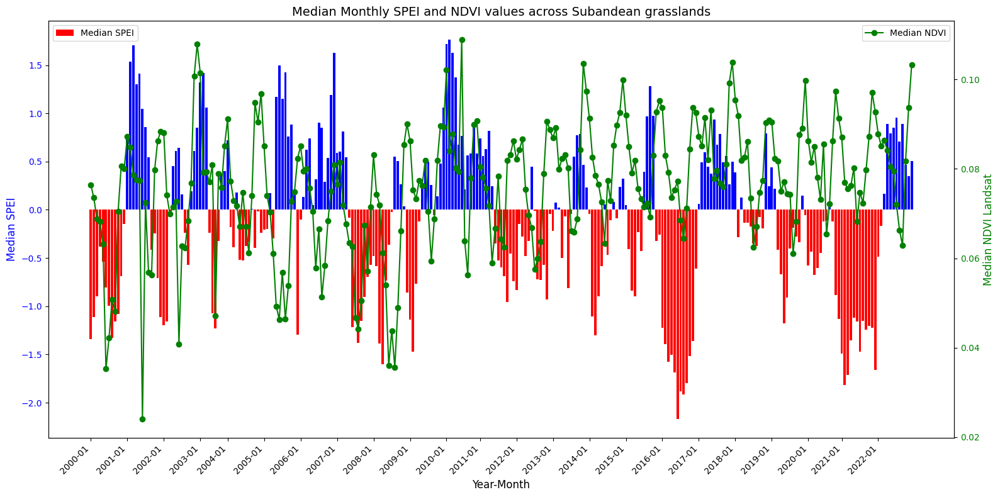

Pearson's correlation coefficient: 0.06
P-value: 3.35e-01


In [ ]:
# Step 1: Calculate median SPEI per month
median_spei_per_month = subandean_grasslands.groupby(["year", "month"])["SPEI"].median().reset_index()
non_na_spei = median_spei_per_month.dropna(subset=["SPEI"])
non_na_spei["year_month"] = non_na_spei["year"].astype(str) + "-" + non_na_spei["month"].astype(str).str.zfill(2)

# Step 2: Calculate median NDVI per month
median_ndvi_per_month = subandean_grasslands.groupby(["year", "month"])["NDVI_Landsat"].median().reset_index()
non_na_ndvi_per_month = median_ndvi_per_month.dropna(subset=["NDVI_Landsat"])
non_na_ndvi_per_month["year_month"] = non_na_ndvi_per_month["year"].astype(str) + "-" + non_na_ndvi_per_month["month"].astype(str).str.zfill(2)

# Ensure alignment of SPEI and NDVI data by merging on 'year' and 'month'
merged_data = pd.merge(non_na_spei, non_na_ndvi_per_month, on=["year", "month", "year_month"], suffixes=('_spei', '_ndvi'))

# Filter for January data for x-axis ticks
january_data = merged_data[merged_data["month"] == 1]

# Step 3: Define colors for SPEI based on sign
colors = np.where(merged_data["SPEI"] >= 0, 'blue', 'red')

# Step 4: Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot SPEI as bars
ax1.bar(merged_data["year_month"], merged_data["SPEI"], color=colors, label="Median SPEI")
ax1.set_xlabel("Year-Month", fontsize=12)
ax1.set_ylabel("Median SPEI", fontsize=12, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title("Median Monthly SPEI and NDVI values across Subandean grasslands", fontsize=14)

# Rotate x-axis labels and set ticks to January only
plt.xticks(
    ticks=january_data.index,  # Use the index of January rows for ticks
    labels=january_data["year_month"],  # Use year-month of January rows for labels
    rotation=45, ha='right', fontsize=10
)

# Add secondary y-axis for NDVI
ax2 = ax1.twinx()
ax2.plot(merged_data["year_month"], merged_data["NDVI_Landsat"], color='green', marker='o', linestyle='-', label="Median NDVI")
ax2.set_ylabel("Median NDVI Landsat", fontsize=12, color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Add legends
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()

# Step 5: Calculate Pearson's correlation coefficient
ndvi_values = merged_data["NDVI_Landsat"]
spei_values = merged_data["SPEI"]
correlation, p_value = stats.pearsonr(ndvi_values, spei_values)

# Print correlation results
print(f"Pearson's correlation coefficient: {correlation:.2f}")
print(f"P-value: {p_value:.2e}")

NDVI values for each month & SPEI values for the entire year.

<ipython-input-43-d5cc16dd71cc>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-43-d5cc16dd71cc>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



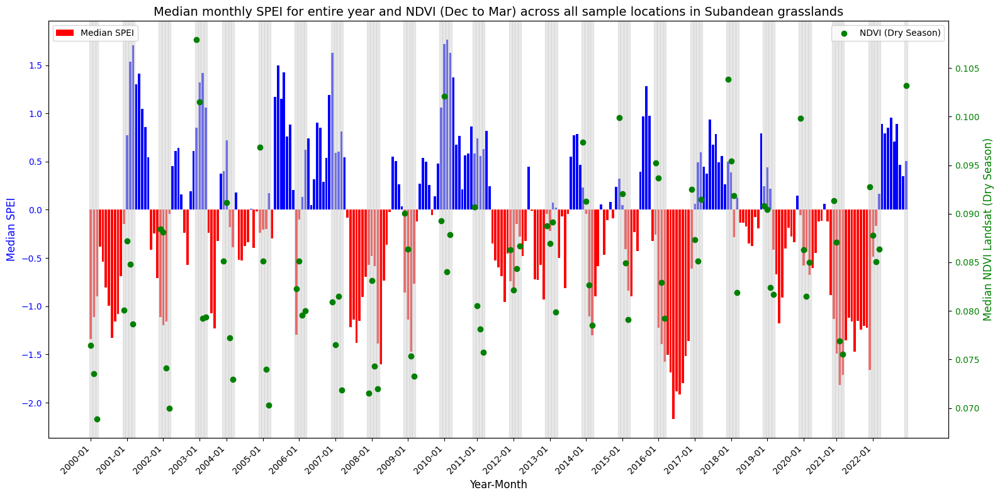

In [ ]:
# Step 1: Calculate median SPEI per month
median_spei_per_month = subandean_grasslands.groupby(["year", "month"])["SPEI"].median().reset_index()
non_na_spei = median_spei_per_month.dropna(subset=["SPEI"])
non_na_spei["year_month"] = non_na_spei["year"].astype(str) + "-" + non_na_spei["month"].astype(str).str.zfill(2)

# Step 2: Calculate median NDVI per month
median_ndvi_per_month = subandean_grasslands.groupby(["year", "month"])["NDVI_Landsat"].median().reset_index()
non_na_ndvi_per_month = median_ndvi_per_month.dropna(subset=["NDVI_Landsat"])
non_na_ndvi_per_month["year_month"] = non_na_ndvi_per_month["year"].astype(str) + "-" + non_na_ndvi_per_month["month"].astype(str).str.zfill(2)

# Ensure alignment of SPEI and NDVI data by merging on 'year' and 'month'
merged_data = pd.merge(non_na_spei, non_na_ndvi_per_month, on=["year", "month", "year_month"], suffixes=('_spei', '_ndvi'))

# Filter NDVI data for December to March
dry_season_ndvi = merged_data[merged_data["month"].isin([12, 1, 2, 3])]

# Filter for January data for x-axis ticks
january_data = merged_data[merged_data["month"] == 1]

# Step 3: Define colors for SPEI based on sign
colors = np.where(merged_data["SPEI"] >= 0, 'blue', 'red')

# Step 4: Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot SPEI as bars
ax1.bar(merged_data["year_month"], merged_data["SPEI"], color=colors, label="Median SPEI")
ax1.set_xlabel("Year-Month", fontsize=12)
ax1.set_ylabel("Median SPEI", fontsize=12, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title("Median monthly SPEI for entire year and NDVI (Dec to Mar) across all sample locations in Subandean grasslands", fontsize=14)

# Add grey background for December to March
for i, row in merged_data.iterrows():
    if row["month"] in [12, 1, 2, 3]:  # Months: December to March
        ax1.axvspan(i - 0.5, i + 0.5, color='lightgray', alpha=0.5)

# Rotate x-axis labels and set ticks to January only
plt.xticks(
    ticks=january_data.index,  # Use the index of January rows for ticks
    labels=january_data["year_month"],  # Use year-month of January rows for labels
    rotation=45, ha='right', fontsize=10
)

# Add secondary y-axis for NDVI
ax2 = ax1.twinx()
ax2.scatter(dry_season_ndvi["year_month"], dry_season_ndvi["NDVI_Landsat"],
            color='green', label="NDVI (Dry Season)")
ax2.set_ylabel("Median NDVI Landsat (Dry Season)", fontsize=12, color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Add legends
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()


### De-trended NDVI (Figure 7)

Monthly de-trended NDVI only for Subandean grassland (2000 - 2024).

*   De-trending by differencing: Subtracting each NDVI value by the previous
 month's value to remove trends and fluctuations.
*   We want to investigate the "normal" SPEI- and the de-trended NDVI-values.



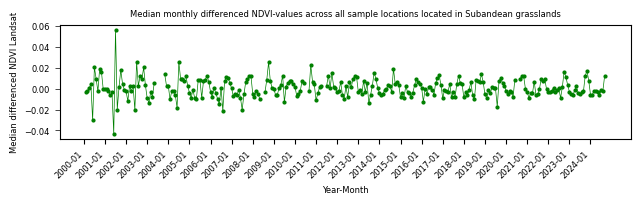

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/NDVI_plots/Detrended_NDVI.pdf
Slope per month: 5.9e-05
Intercept: 0.068
R-value: 0.36
P-value of the slope: 0.33
Standard error: 9e-06
Slope per year: 0.00071


In [ ]:
# Define the folder to save the plots
save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/NDVI_plots/'
file_path = os.path.join(save_path, f"Detrended_NDVI.pdf")

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Step 1: Calculate the median NDVI_Landsat_diff value per month across all sample locations
median_diff_ndvi_per_month = subandean_grasslands.groupby(["year", "month"])["NDVI_Landsat_diff"].median().reset_index()

# Drop NAs:
#non_na_diff_ndvi_per_month = median_diff_ndvi_per_month.dropna(subset=["NDVI_Landsat_diff"])

non_na_diff_ndvi_per_month = median_diff_ndvi_per_month

# Step 2: Combine 'year' and 'month' into a single column for plotting
non_na_diff_ndvi_per_month["year_month"] = non_na_diff_ndvi_per_month["year"].astype(str) + "-" + non_na_diff_ndvi_per_month["month"].astype(str).str.zfill(2)

# Step 3: Create the plot
fig, ax = plt.subplots(figsize=(2.9/2.54*5, 2.9/2.54))

# Plot the median NDVI_Landsat_diff values as a green line
ax.plot(non_na_diff_ndvi_per_month["year_month"], non_na_diff_ndvi_per_month["NDVI_Landsat_diff"],
        color='green', marker='o', linestyle='-', label='Median NDVI_Landsat_diff', markersize = 2, linewidth = 0.5)

# Step 4: Set labels and title
ax.set_xlabel("Year-Month", fontsize=6)
ax.set_ylabel("Median differenced NDVI Landsat", fontsize=6)
ax.set_title("Median monthly differenced NDVI-values across all sample locations located in Subandean grasslands", fontsize=6)

# Rotate x-axis labels and reduce their frequency for readability
plt.xticks(ticks=np.arange(0, len(non_na_diff_ndvi_per_month), step=12),  # Show every 12th month (once per year)
           labels=non_na_diff_ndvi_per_month["year_month"].iloc[::12],
           rotation=45, ha='right', fontsize=6)


# Set y-ticks label size
ax.tick_params(axis='y', labelsize = 6, width = 0.5)

# Remove extra space: explicitly set axes position
ax.set_position([0, 0, 1, 1])  # Fill the entire figure area

# Save plot
plt.show()
fig.savefig(file_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0)
plt.close(fig)
print(f"Figure saved to {file_path}")

# Print the slope, intercept, p-value, and standard error
print("Slope per month:", f"{slope:.2g}")
print("Intercept:",  f"{intercept:.2g}")
print("R-value:",  f"{r_value:.2g}")
print("P-value of the slope:",  f"{p_value:.2g}")
print("Standard error:",  f"{std_err:.2g}")
slope_per_year = slope * 12
print("Slope per year:", f"{slope_per_year:.2g}")


# **** WITH DE-TREND

# 1.SPEI and detrended NDVI (per month)


## Across all sample locations

<ipython-input-45-dc538b39634a>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-45-dc538b39634a>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



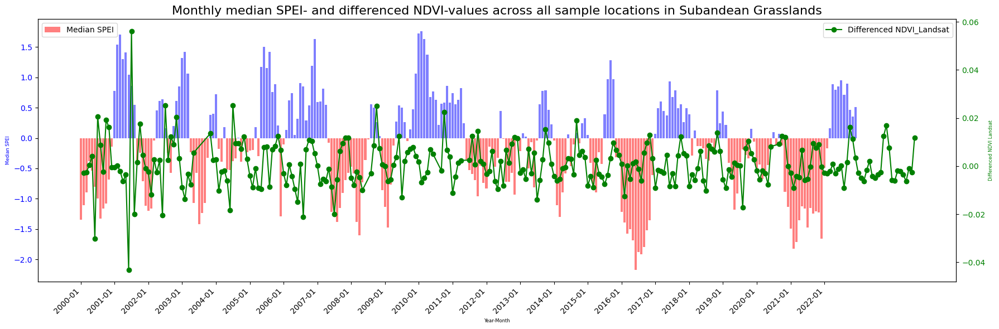

In [ ]:
# Step 1: Calculate the median SPEI and NDVI_Landsat_diff values per month across all sample locations
median_spei_per_month = subandean_grasslands.groupby(["year", "month"])["SPEI"].median().reset_index()
median_diff_ndvi_per_month = subandean_grasslands.groupby(["year", "month"])["NDVI_Landsat_diff"].median().reset_index()

# Drop NAs for each dataset
non_na_spei = median_spei_per_month.dropna(subset=["SPEI"])
non_na_diff_ndvi_per_month = median_diff_ndvi_per_month.dropna(subset=["NDVI_Landsat_diff"])

# Combine 'year' and 'month' into a single column for plotting in both datasets
non_na_spei["year_month"] = non_na_spei["year"].astype(str) + "-" + non_na_spei["month"].astype(str).str.zfill(2)
non_na_diff_ndvi_per_month["year_month"] = non_na_diff_ndvi_per_month["year"].astype(str) + "-" + non_na_diff_ndvi_per_month["month"].astype(str).str.zfill(2)

# Step 2: Define colors
colors = np.where(non_na_spei["SPEI"] >= 0, 'blue', 'red')

# Step 3: Create the plot with a larger figure size for spacing
fig, ax1 = plt.subplots(figsize=(18, 6))

# Plot the SPEI bar chart with colors for positive and negative values, including alpha for transparency
ax1.bar(non_na_spei["year_month"], non_na_spei["SPEI"], color=colors, alpha=0.5, label='Median SPEI')
ax1.set_xlabel("Year-Month", fontsize=6)
ax1.set_ylabel("Median SPEI", fontsize=6, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Rotate x-axis labels for readability
plt.xticks(ticks=np.arange(0, len(non_na_spei), step=12),  # Show every 12th month (once per year)
           labels=non_na_spei["year_month"].iloc[::12],
           rotation=45, ha='right', fontsize=10)

# Step 4: Add the NDVI data as a line plot using a secondary y-axis
ax2 = ax1.twinx()
ax2.plot(non_na_diff_ndvi_per_month["year_month"], non_na_diff_ndvi_per_month["NDVI_Landsat_diff"],
         color='green', marker='o', linestyle='-', linewidth=1.5, label='Differenced NDVI_Landsat')
ax2.set_ylabel("Differenced NDVI Landsat", fontsize=6, color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Set title with a slightly larger font
plt.title("Monthly median SPEI- and differenced NDVI-values across all sample locations in Subandean Grasslands", fontsize=16)

# Add legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()


## Per sample location

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



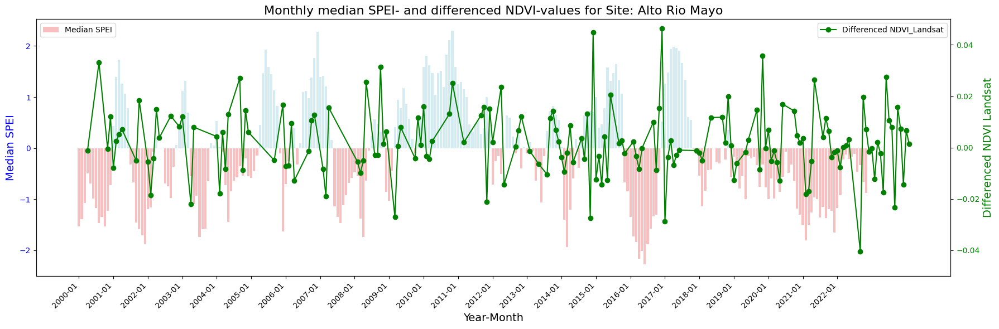

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



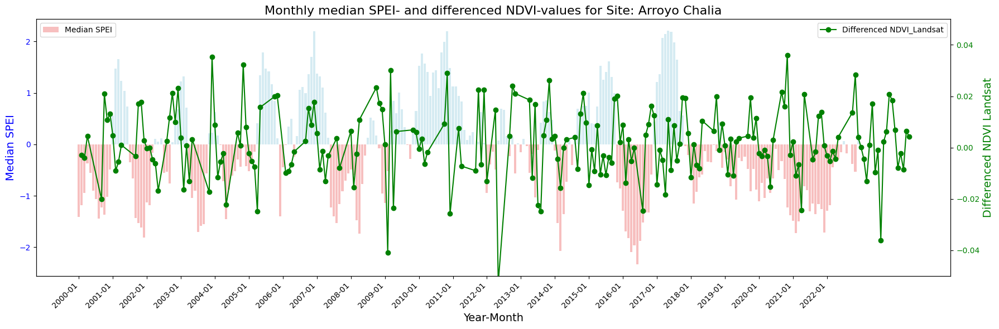

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



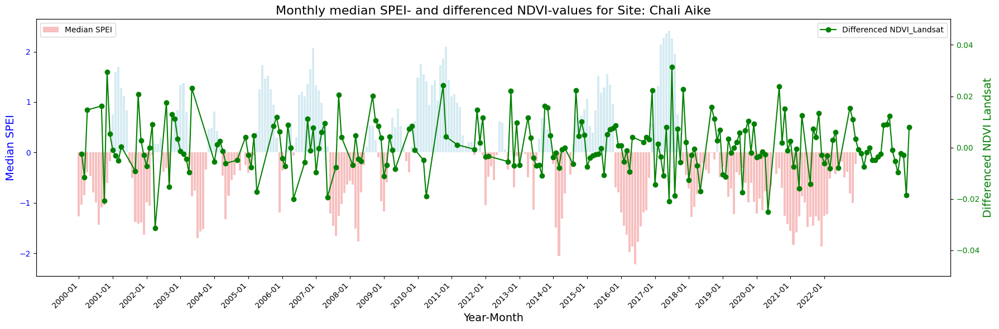

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



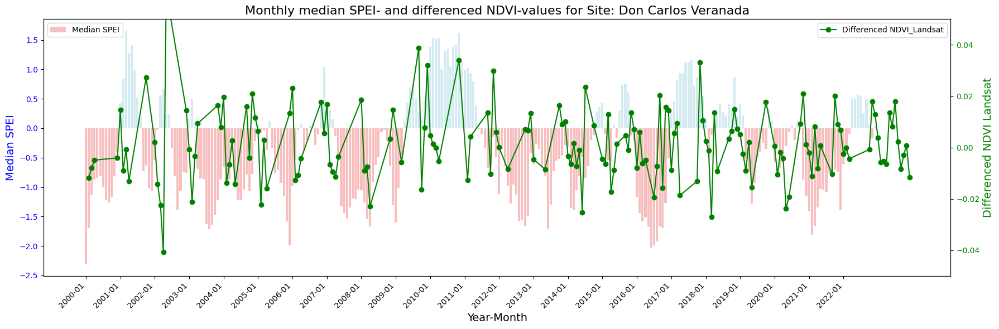

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



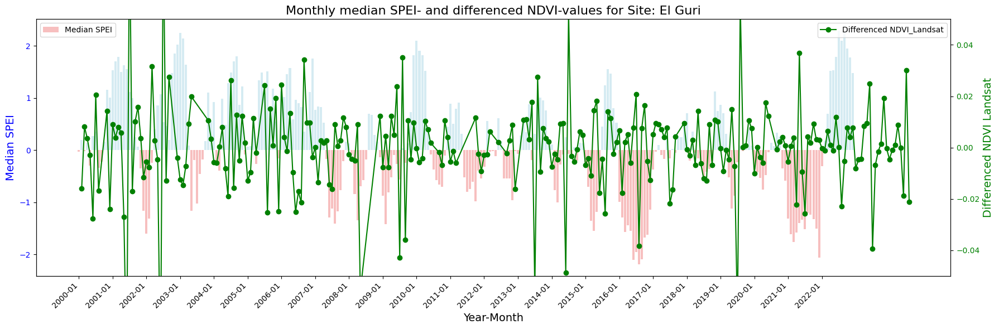

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



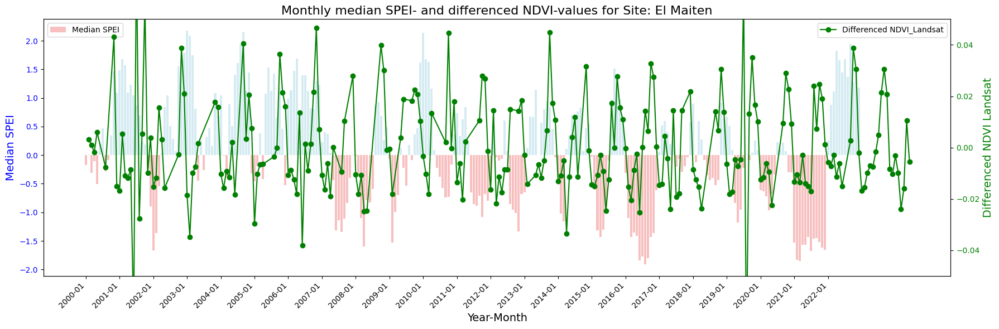

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



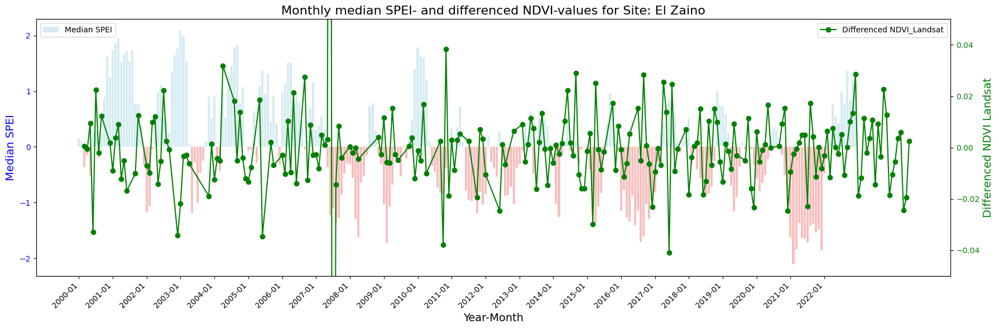

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



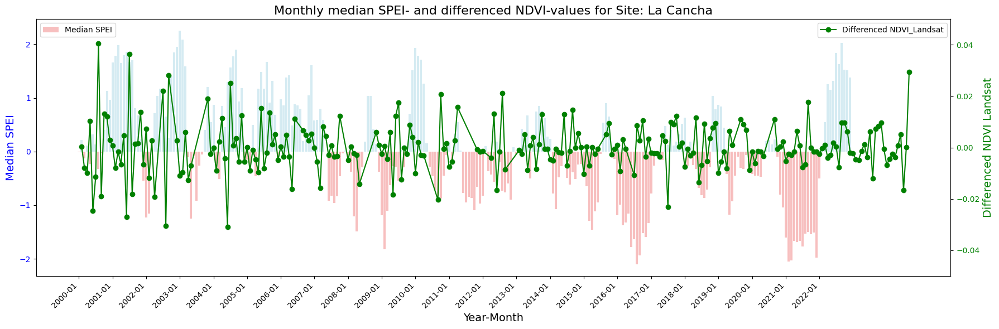

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



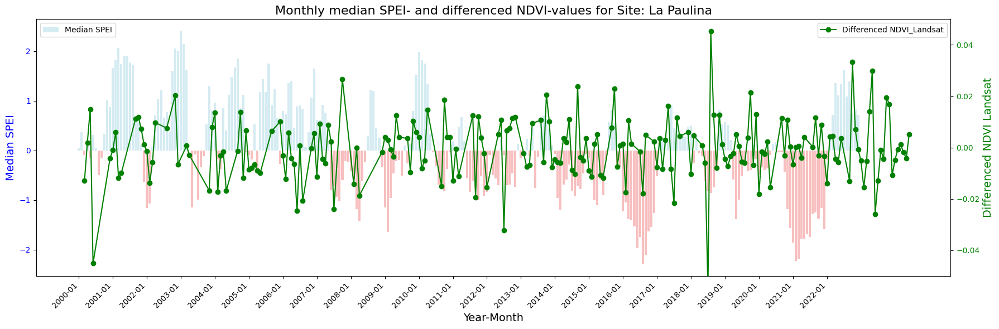

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



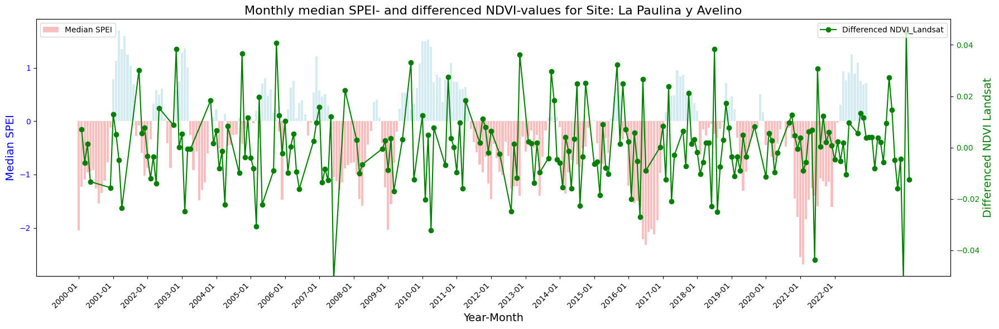

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



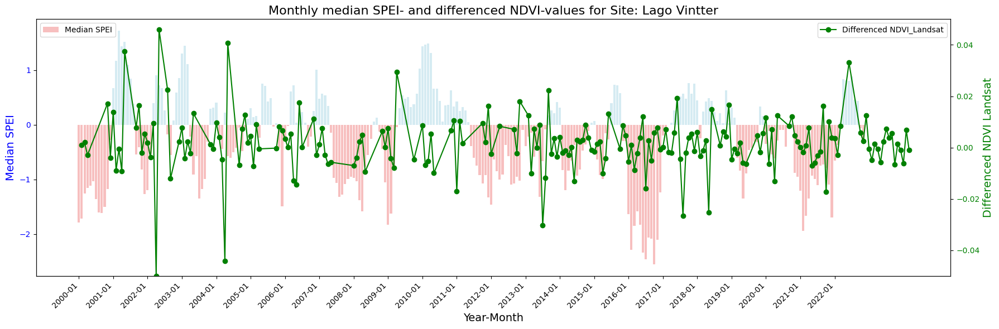

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



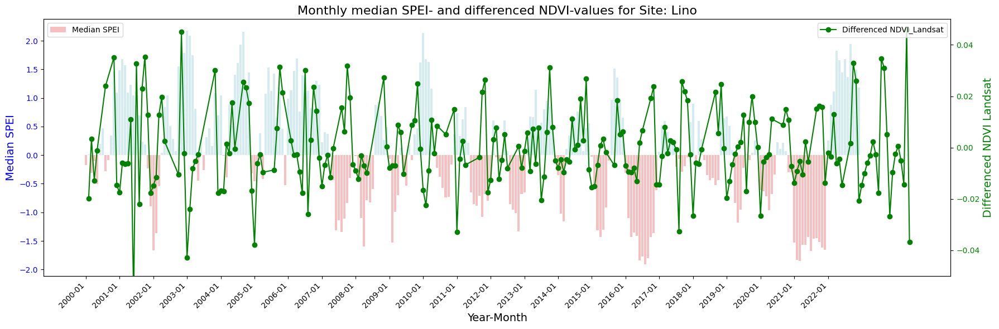

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



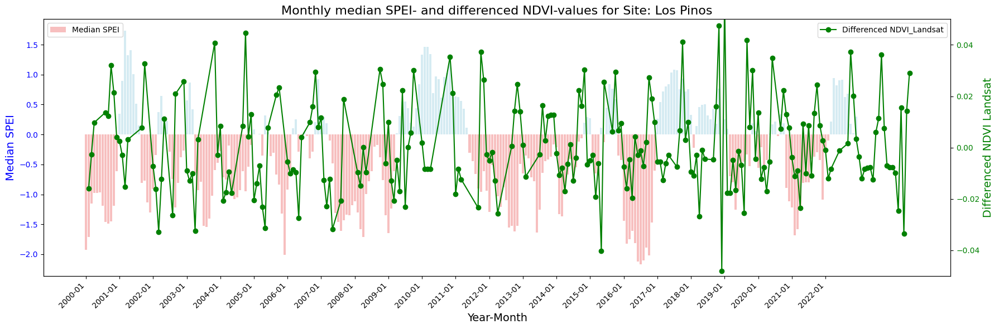

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



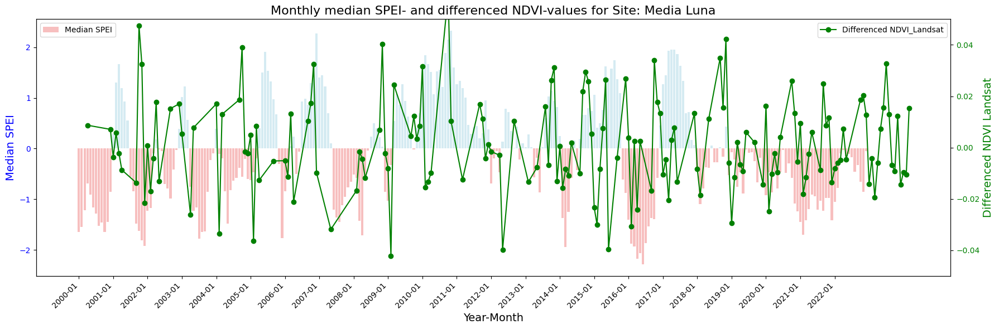

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



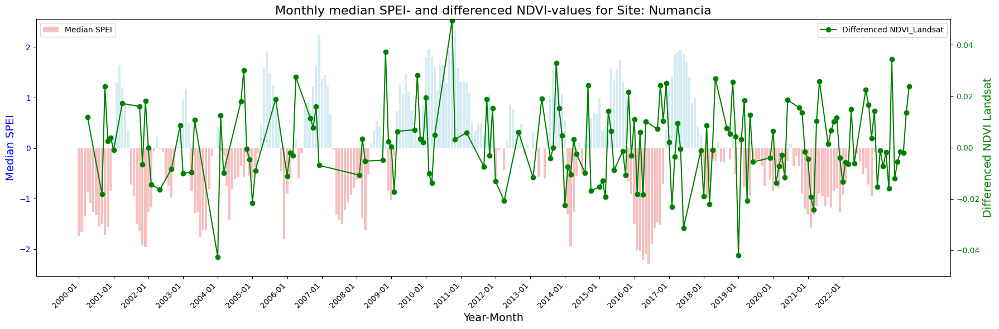

<ipython-input-46-de0b4753c2a5>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-46-de0b4753c2a5>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



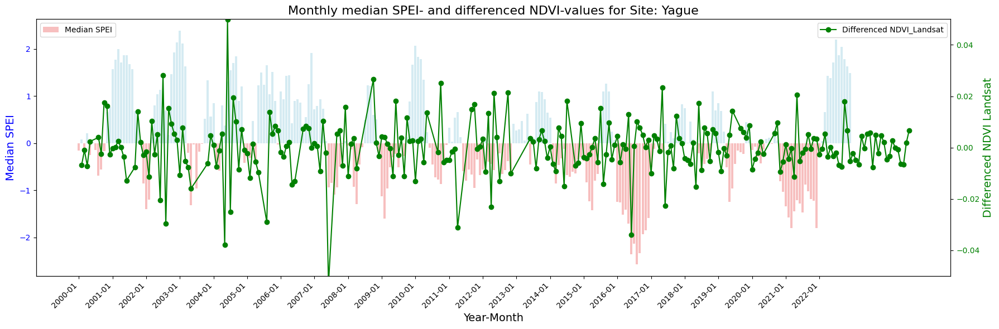

In [ ]:
# Define the range for NDVI_Landsat_diff for consistent y-axis limits across all sites
ndvi_min = -0.05
ndvi_max = 0.05

# Loop through each unique Site_Name to create individual plots
for site in subandean_grasslands["Site_Name"].unique():
    # Filter the data for the current Site_Name
    site_data = subandean_grasslands[subandean_grasslands["Site_Name"] == site]

    # Calculate the median SPEI and NDVI_Landsat_diff values per month for this site
    median_spei_per_month = site_data.groupby(["year", "month"])["SPEI"].median().reset_index()
    median_diff_ndvi_per_month = site_data.groupby(["year", "month"])["NDVI_Landsat_diff"].median().reset_index()

    # Drop NAs for each dataset
    non_na_spei = median_spei_per_month.dropna(subset=["SPEI"])
    non_na_diff_ndvi_per_month = median_diff_ndvi_per_month.dropna(subset=["NDVI_Landsat_diff"])

    # Combine 'year' and 'month' into a single column for plotting in both datasets
    non_na_spei["year_month"] = non_na_spei["year"].astype(str) + "-" + non_na_spei["month"].astype(str).str.zfill(2)
    non_na_diff_ndvi_per_month["year_month"] = non_na_diff_ndvi_per_month["year"].astype(str) + "-" + non_na_diff_ndvi_per_month["month"].astype(str).str.zfill(2)

    # Define colors based on the sign of the median SPEI value with faint colors
    colors = np.where(non_na_spei["SPEI"] >= 0, 'lightblue', 'lightcoral')

    # Create the plot
    fig, ax1 = plt.subplots(figsize=(18, 6))

    # Plot the SPEI bar chart with colors for positive and negative values, including alpha for transparency
    ax1.bar(non_na_spei["year_month"], non_na_spei["SPEI"], color=colors, alpha=0.5, label='Median SPEI')
    ax1.set_xlabel("Year-Month", fontsize=14)
    ax1.set_ylabel("Median SPEI", fontsize=14, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    # Rotate x-axis labels for readability
    plt.xticks(ticks=np.arange(0, len(non_na_spei), step=12),  # Show every 12th month (once per year)
               labels=non_na_spei["year_month"].iloc[::12],
               rotation=45, ha='right', fontsize=10)

    # Add the NDVI data as a line plot using a secondary y-axis
    ax2 = ax1.twinx()
    ax2.plot(non_na_diff_ndvi_per_month["year_month"], non_na_diff_ndvi_per_month["NDVI_Landsat_diff"],
             color='green', marker='o', linestyle='-', linewidth=1.5, label='Differenced NDVI_Landsat')
    ax2.set_ylabel("Differenced NDVI Landsat", fontsize=14, color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    # Set consistent y-axis limits for NDVI across all plots for comparability
    ax2.set_ylim(ndvi_min, ndvi_max)

    # Set title for each site
    plt.title(f"Monthly median SPEI- and differenced NDVI-values for Site: {site}", fontsize=16)

    # Add legends
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')

    plt.tight_layout()
    plt.show()


# 2.SPEI (Sep to Mar) and de-trended NDVI (Dec to Mar)

## Across all sample locations

<ipython-input-47-ec6a618c51b9>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-47-ec6a618c51b9>:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



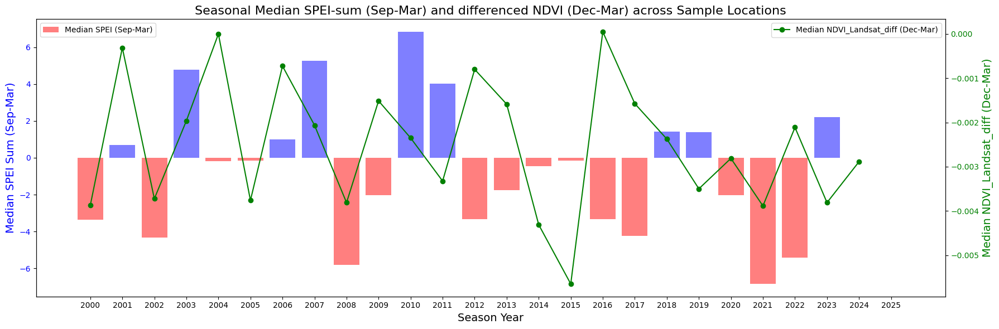

In [ ]:
# Step 1: Define the seasons for SPEI (September to March) and NDVI (December to March)

# For SPEI, the season is from septermber to march
subandean_grasslands['season_spei'] = np.where(subandean_grasslands['month'].isin([9, 10, 11, 12, 1, 2, 3]),
                                               subandean_grasslands['year'], np.nan)

# For NDVI, the season is from December to march
subandean_grasslands['season_ndvi'] = np.where(subandean_grasslands['month'].isin([12, 1, 2, 3]),
                                               subandean_grasslands['year'], np.nan)

# Drop rows where seasons are not defined and create 2 new data frames, one for SPEI and one for NDVI
spei_season_data = subandean_grasslands.dropna(subset=['season_spei'])
ndvi_season_data = subandean_grasslands.dropna(subset=['season_ndvi'])

# Step 2: Calculate medians

# Define the season years for SPEI - if the month is before September, the "season" year is one year before the actual year.
spei_season_data['season_year'] = np.where(spei_season_data['month'] < 9, spei_season_data['year'], spei_season_data['year'] + 1)

# Calculate the median SPEI sum from September to March for each Site_Name per season
median_spei_sep_to_march = (spei_season_data.groupby(['season_year', 'Site_Name'])['SPEI']
                            .sum().groupby(level=0).median().reset_index())

# Selecting two columns (I think ?)
median_spei_sep_to_march.columns = ['season_year', 'median_spei_sep_to_march']

# Define the season year here as well (similar to SPEI, but using December as a cutoff month - actually it does not matter if it is September of December)
ndvi_season_data['season_year'] = np.where(ndvi_season_data['month'] < 12, ndvi_season_data['year'], ndvi_season_data['year'] + 1)

# Calculate the median NDVI_Landsat_diff from December to March for each Site_Name per season
median_diff_ndvi_dec_to_mar = (ndvi_season_data.groupby(['season_year', 'Site_Name'])['NDVI_Landsat_diff']
                               .median().groupby(level=0).median().reset_index())

# Selecting two columns (I think ?)
median_diff_ndvi_dec_to_mar.columns = ['season_year', 'median_diff_ndvi_dec_to_mar']

# Step 4: Merge the two seasonal datasets on 'season_year' to align the SPEI and NDVI values for plotting
seasonal_data = pd.merge(median_spei_sep_to_march, median_diff_ndvi_dec_to_mar, on='season_year', how='inner')

# Step 5: Create the plot
fig, ax1 = plt.subplots(figsize=(18, 6))

# Plot the SPEI data as bars
colors = np.where(seasonal_data["median_spei_sep_to_march"] >= 0, 'blue', 'red')
ax1.bar(seasonal_data["season_year"].astype(str), seasonal_data["median_spei_sep_to_march"], color=colors, alpha=0.5, label='Median SPEI (Sep-Mar)')
ax1.set_xlabel("Season Year", fontsize=14)
ax1.set_ylabel("Median SPEI Sum (Sep-Mar)", fontsize=14, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Step 6: Add the NDVI data as a line plot using a secondary y-axis
ax2 = ax1.twinx()
ax2.plot(seasonal_data["season_year"].astype(str), seasonal_data["median_diff_ndvi_dec_to_mar"],
         color='green', marker='o', linestyle='-', linewidth=1.5, label='Median NDVI_Landsat_diff (Dec-Mar)')
ax2.set_ylabel("Median NDVI_Landsat_diff (Dec-Mar)", fontsize=14, color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Set title
plt.title("Seasonal Median SPEI-sum (Sep-Mar) and differenced NDVI (Dec-Mar) across Sample Locations", fontsize=16)

# Add legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

## Per sample location

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



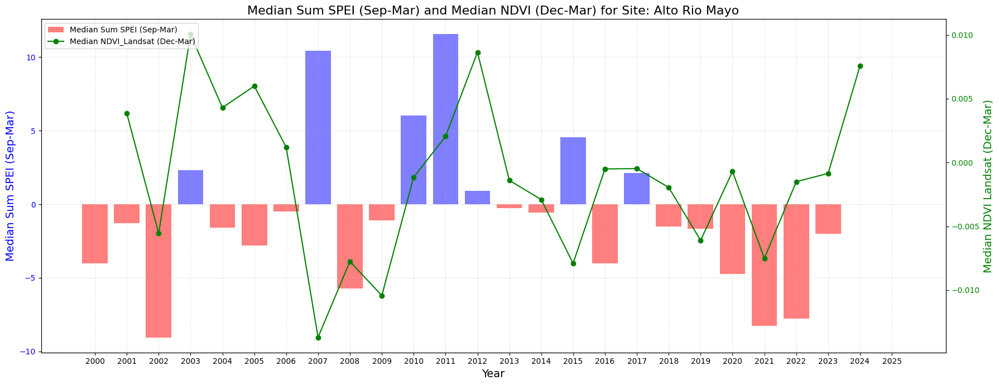

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



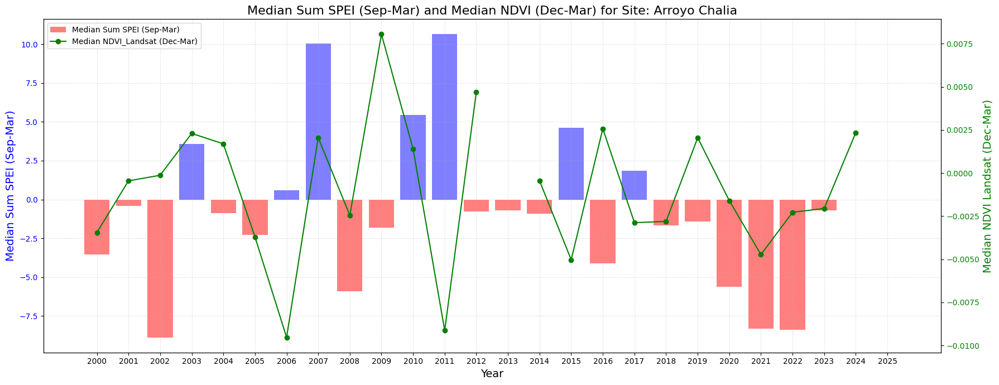

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



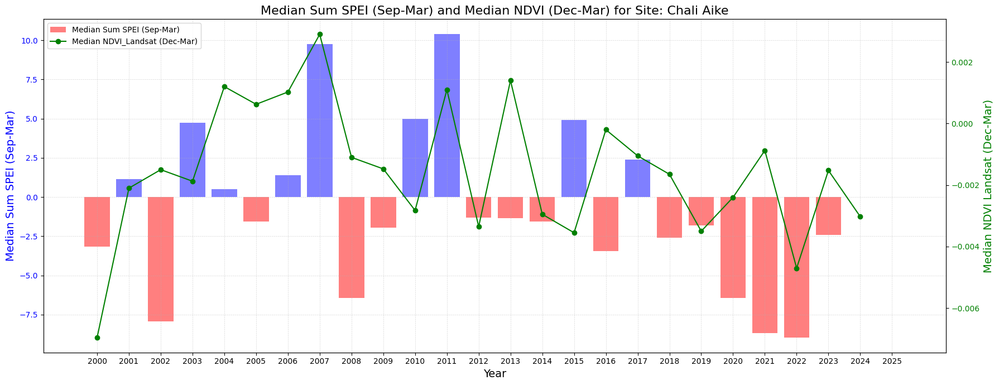

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



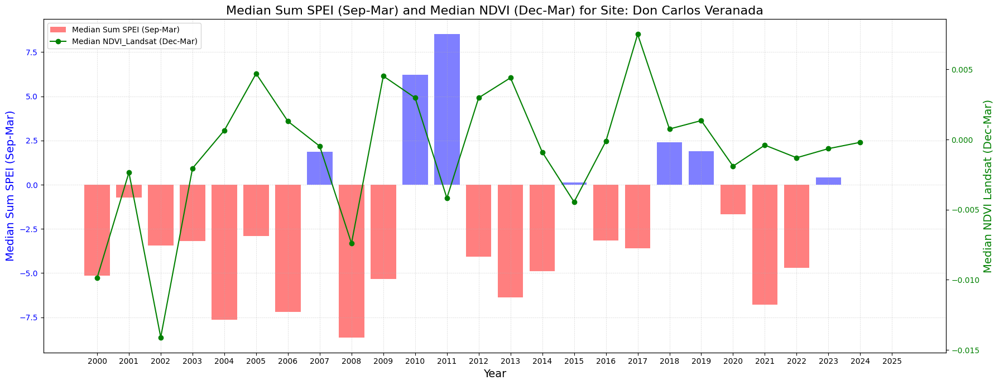

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



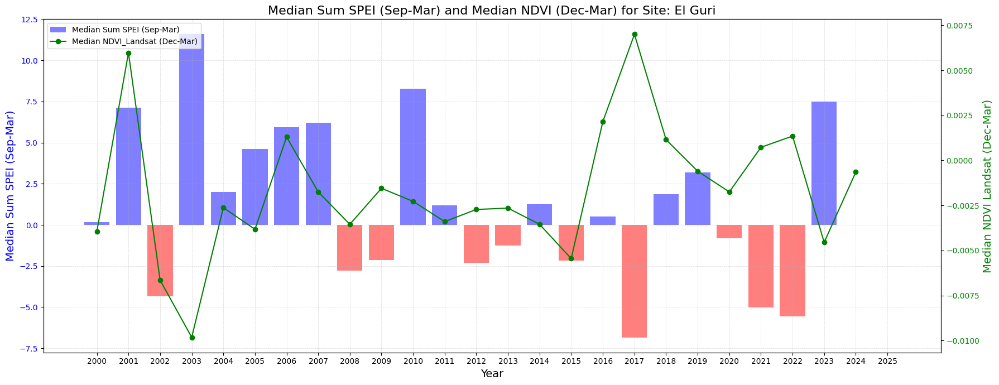

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



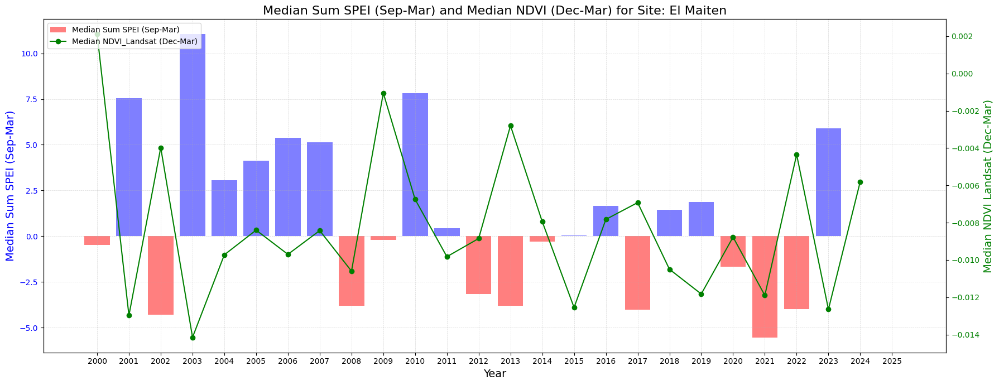

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



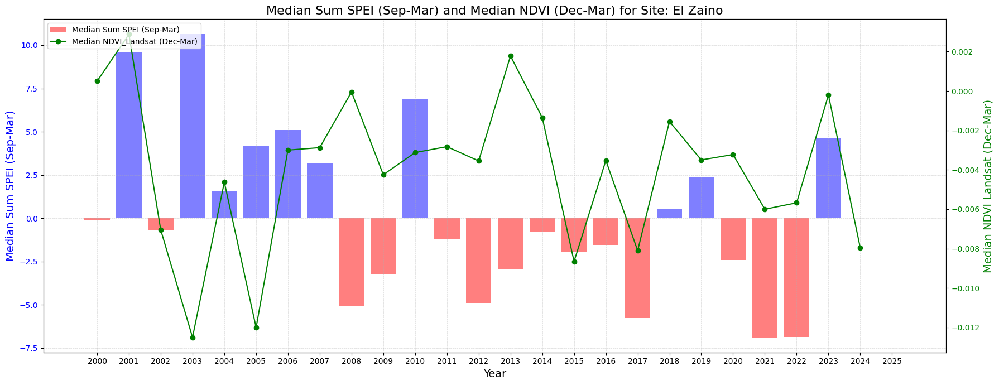

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



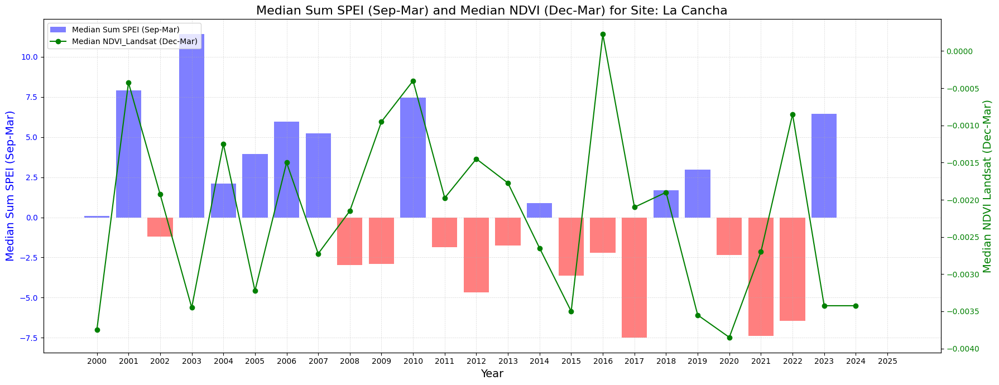

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



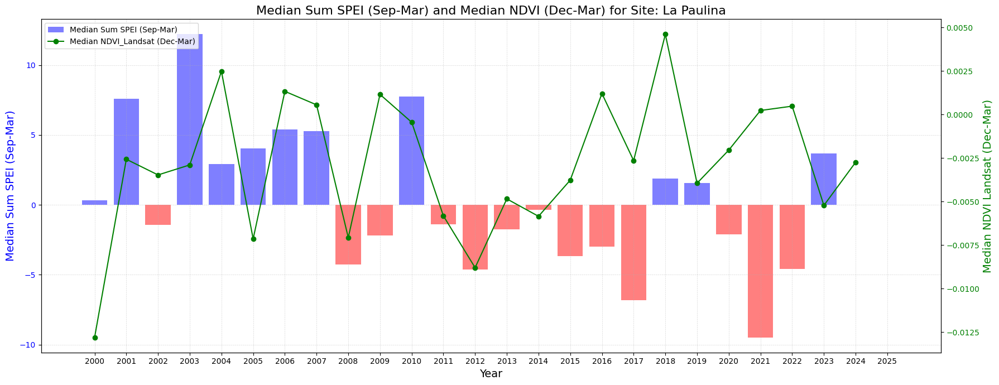

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



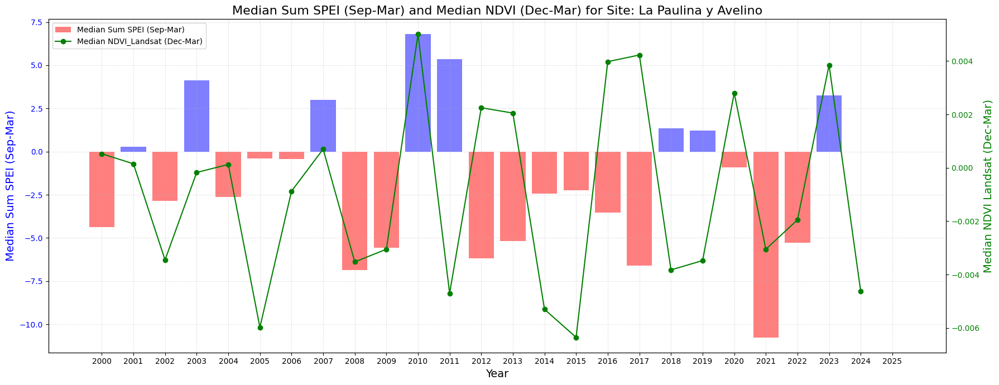

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



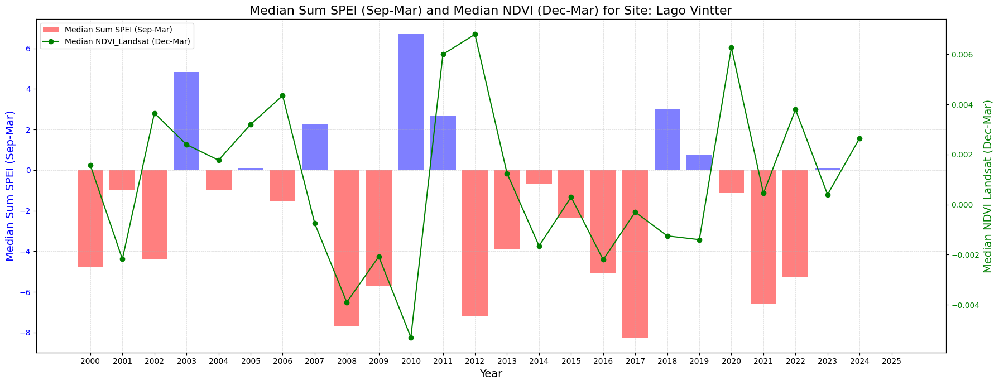

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



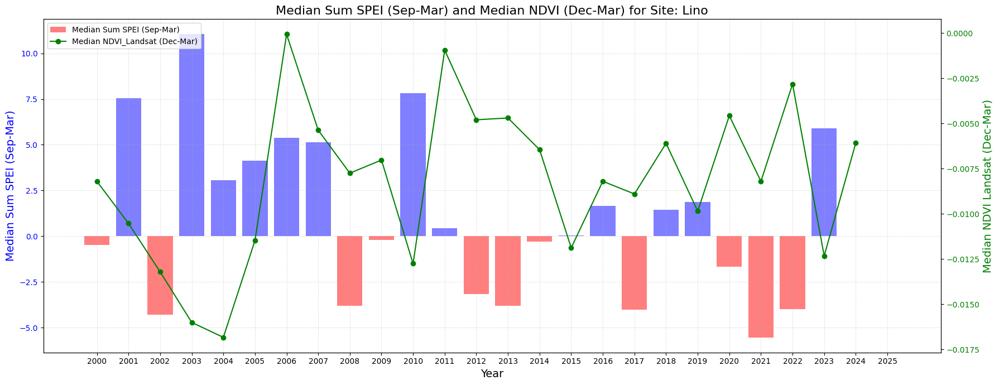

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



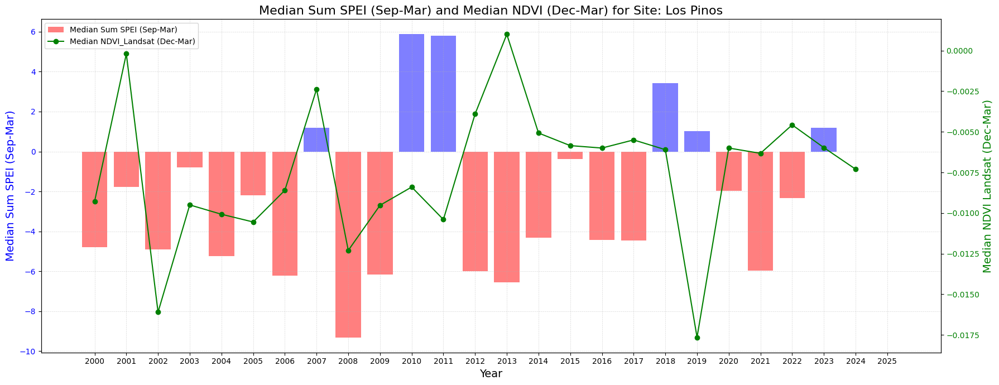

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



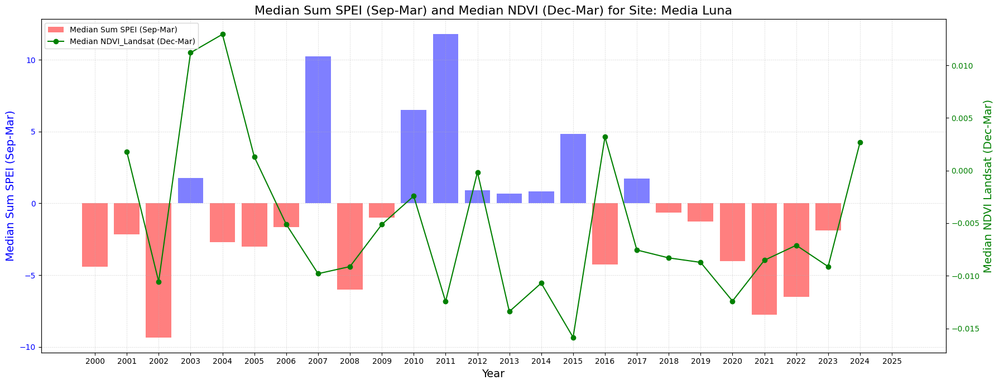

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



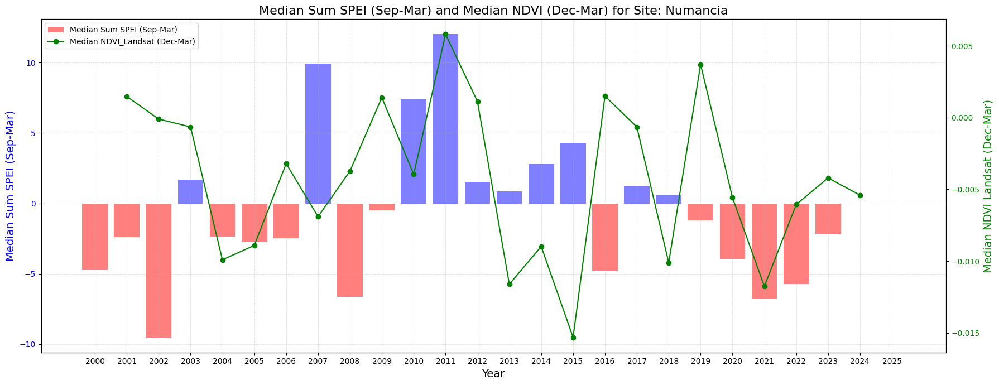

<ipython-input-48-4c7a581731a4>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-48-4c7a581731a4>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



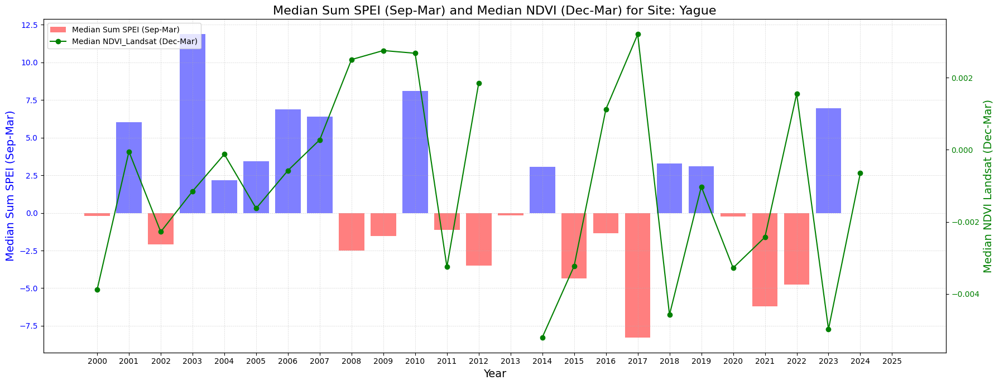

In [ ]:
# Step 1: Initialize an empty dictionary to store the aggregated data for each site
site_data = {}

# Loop over each unique Site_Name
for site in subandean_grasslands["Site_Name"].unique():
    # Filter data for the current site
    site_data[site] = {}

    site_data[site]["spei_data"] = subandean_grasslands[(subandean_grasslands["Site_Name"] == site) &
                                                         (subandean_grasslands["month"].isin([9, 10, 11, 12, 1, 2, 3]))]
    site_data[site]["ndvi_data"] = subandean_grasslands[(subandean_grasslands["Site_Name"] == site) &
                                                        (subandean_grasslands["month"].isin([12, 1, 2, 3]))]

    # Step 2: Calculate the period_year for SPEI and NDVI data
    site_data[site]["spei_data"]["period_year"] = site_data[site]["spei_data"].apply(
        lambda row: row["year"] if row["month"] < 9 else row["year"] + 1, axis=1
    )
    site_data[site]["ndvi_data"]["period_year"] = site_data[site]["ndvi_data"].apply(
        lambda row: row["year"] if row["month"] < 12 else row["year"] + 1, axis=1
    )

    # Step 3: Calculate the median sum of SPEI and median NDVI_Landsat for each period and site
    spei_sum = site_data[site]["spei_data"].groupby("period_year")["SPEI"].sum().reset_index()
    spei_sum.columns = ["year", "SPEI_sum"]

    ndvi_median = site_data[site]["ndvi_data"].groupby("period_year")["NDVI_Landsat_diff"].median().reset_index()
    ndvi_median.columns = ["year", "NDVI_Landsat_diff_median"]

    # Step 4: Prepare colors for the SPEI bar chart based on the sign of the median sum SPEI value
    colors = np.where(spei_sum["SPEI_sum"] >= 0, 'blue', 'red')

    # Step 5: Plot for each Site_Name
    fig, ax1 = plt.subplots(figsize=(18, 7))

    # Plot the median sum SPEI values as a bar chart on ax1
    ax1.bar(spei_sum["year"].astype(str), spei_sum["SPEI_sum"], color=colors, alpha=0.5, label='Median Sum SPEI (Sep-Mar)')

    # Set labels and title for the SPEI plot
    ax1.set_xlabel("Year", fontsize=14)
    ax1.set_ylabel("Median Sum SPEI (Sep-Mar)", fontsize=14, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title(f"Median Sum SPEI (Sep-Mar) and Median NDVI (Dec-Mar) for Site: {site}", fontsize=16)

    # Step 6: Add the NDVI data as a line plot using a secondary y-axis
    ax2 = ax1.twinx()
    ax2.plot(ndvi_median["year"].astype(str), ndvi_median["NDVI_Landsat_diff_median"], color='green', marker='o', linestyle='-', linewidth=1.5, label='Median NDVI_Landsat (Dec-Mar)')
    ax2.set_ylabel("Median NDVI Landsat (Dec-Mar)", fontsize=14, color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    # Rotate x-axis labels for readability
    plt.xticks(rotation=45, ha='right', fontsize=12)

    # Customize grid for better visibility
    ax1.grid(visible=True, which='major', linestyle='--', linewidth=0.5, alpha=0.5)

    # Add legends for clarity
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

    plt.tight_layout()
    plt.show()

# **** WITHOUT DE-TREND

### NDVI

Median NDVI-values only calculated for the dry season (Dec to Mar).

In [ ]:
# Define months for the December to March period, including both current and following year's months
dec_to_mar_months = [12, 1, 2, 3]

# Filter relevant columns; select only NDVI_Landsat for months December to March
subandean_grasslands_NDVI = subandean_grasslands[subandean_grasslands["month"].isin(dec_to_mar_months)].copy()

# Adjust "season" to reflect the year corresponding to the wet season (December to March period)
# For months from January to March, the season should be shifted to the previous year
subandean_grasslands_NDVI.loc[subandean_grasslands_NDVI["month"] <= 3, "season"] = subandean_grasslands_NDVI["year"]
subandean_grasslands_NDVI.loc[subandean_grasslands_NDVI["month"] == 12, "season"] = subandean_grasslands_NDVI["year"] + 1

# Ensure the "season" column is an integer
subandean_grasslands_NDVI["season"] = subandean_grasslands_NDVI["season"].astype(int)

# Calculate the median of NDVI_Landsat by site and season (for December to March), ignoring missing values
subandean_grasslands_median_NDVI_dec_to_mar = subandean_grasslands_NDVI.groupby(["Site_Name", "season"], as_index=False)["NDVI_Landsat"].median()

# Rename the column to "Median_NDVI_Dec_to_Mar"
subandean_grasslands_median_NDVI_dec_to_mar.rename(columns={"NDVI_Landsat": "Median_NDVI_Dec_to_Mar"}, inplace=True)

# Replace all 0 values in the "Median_NDVI_Dec_to_Mar" column with NaN
subandean_grasslands_median_NDVI_dec_to_mar["Median_NDVI_Dec_to_Mar"] = subandean_grasslands_median_NDVI_dec_to_mar["Median_NDVI_Dec_to_Mar"].replace(0, np.nan)

# Display the final median NDVI DataFrame
subandean_grasslands_median_NDVI_dec_to_mar


,Site_Name,season,Median_NDVI_Dec_to_Mar
0,Alto Rio Mayo,2000,0.071650
1,Alto Rio Mayo,2001,0.072600
2,Alto Rio Mayo,2002,0.062225
3,Alto Rio Mayo,2003,0.079200
4,Alto Rio Mayo,2004,0.074500
...,...,...,...
411,Yague,2021,0.072775
412,Yague,2022,0.082600
413,Yague,2023,0.078075
414,Yague,2024,0.081500


### SPEI

Median SPEI-sums calculated for Sep to Mar.

In [ ]:
# Define months for the September to March period, including both current and following year's months
sep_to_mar_months = [9, 10, 11, 12, 1, 2, 3]

# Filter relevant columns; select only SPEI for months September to March
subandean_grasslands_SPEI = subandean_grasslands[subandean_grasslands["month"].isin(sep_to_mar_months)].copy()

# Adjust "season" to reflect the year corresponding to the dry season (September to March period)
# For months from January to March, the season should be shifted to the previous year
subandean_grasslands_SPEI.loc[subandean_grasslands_SPEI["month"] <= 3, "season"] = subandean_grasslands_SPEI["year"]
subandean_grasslands_SPEI.loc[subandean_grasslands_SPEI["month"] >= 9, "season"] = subandean_grasslands_SPEI["year"] + 1

# Ensure the "season" column is an integer
subandean_grasslands_SPEI["season"] = subandean_grasslands_SPEI["season"].astype(int)

# Calculate the sum of SPEI by site and season (for September to March), ignoring missing values
subandean_grasslands_SPEI_sum_sep_to_march = subandean_grasslands_SPEI.groupby(["Site_Name", "season"], as_index=False)["SPEI"].sum()

# Rename the column to "SPEI_Sep_to_Mar"
subandean_grasslands_SPEI_sum_sep_to_march.rename(columns={"SPEI": "SPEI_Sep_to_Mar"}, inplace=True)

# Replace all 0 values in the "SPEI_Sep_to_Mar" column with NaN
subandean_grasslands_SPEI_sum_sep_to_march["SPEI_Sep_to_Mar"] = subandean_grasslands_SPEI_sum_sep_to_march["SPEI_Sep_to_Mar"].replace(0, np.nan)

# Display the final sum SPEI DataFrame
subandean_grasslands_SPEI_sum_sep_to_march

,Site_Name,season,SPEI_Sep_to_Mar
0,Alto Rio Mayo,2000,-4.001544
1,Alto Rio Mayo,2001,-1.277271
2,Alto Rio Mayo,2002,-9.039056
3,Alto Rio Mayo,2003,2.331902
4,Alto Rio Mayo,2004,-1.602480
...,...,...,...
411,Yague,2021,-6.216622
412,Yague,2022,-4.742805
413,Yague,2023,6.962688
414,Yague,2024,NaN


### Merge NDVI and SPEI

I merge the the median NDVI-values of Dec-March & the median SPEI-values of Sep-Nov.

In [ ]:
# Merge the two DataFrames on 'Site_Name' and 'season'
subandean_grasslands_seasonal = pd.merge(
    subandean_grasslands_SPEI_sum_sep_to_march,
    subandean_grasslands_median_NDVI_dec_to_mar,
    on=["Site_Name", "season"],
    how="inner"  # Use 'inner' to keep only rows with matching Site_Name and season
)

# Display the merged DataFrame
subandean_grasslands_seasonal

,Site_Name,season,SPEI_Sep_to_Mar,Median_NDVI_Dec_to_Mar
0,Alto Rio Mayo,2000,-4.001544,0.071650
1,Alto Rio Mayo,2001,-1.277271,0.072600
2,Alto Rio Mayo,2002,-9.039056,0.062225
3,Alto Rio Mayo,2003,2.331902,0.079200
4,Alto Rio Mayo,2004,-1.602480,0.074500
...,...,...,...,...
411,Yague,2021,-6.216622,0.072775
412,Yague,2022,-4.742805,0.082600
413,Yague,2023,6.962688,0.078075
414,Yague,2024,NaN,0.081500


Add NDVI z-values.

In [ ]:
# Calculate the mean and standard deviation for each Site_Name
site_stats = subandean_grasslands_seasonal.groupby("Site_Name")["Median_NDVI_Dec_to_Mar"].agg(['mean', 'std']).reset_index()

# Merge the statistics back to the original DataFrame
subandean_grasslands_seasonal = subandean_grasslands_seasonal.merge(site_stats, on="Site_Name", how="left")

# Calculate the z-normalized NDVI_Landsat values
subandean_grasslands_seasonal["NDVI_zvalues"] = (
    (subandean_grasslands_seasonal["Median_NDVI_Dec_to_Mar"] - subandean_grasslands_seasonal["mean"]) /
    subandean_grasslands_seasonal["std"]
)

# Drop the temporary 'mean' and 'std' columns if no longer needed
subandean_grasslands_seasonal = subandean_grasslands_seasonal.drop(columns=["mean", "std"])

# Display the DataFrame with the new NDVI_zvalues column
subandean_grasslands_seasonal

,Site_Name,season,SPEI_Sep_to_Mar,Median_NDVI_Dec_to_Mar,NDVI_zvalues
0,Alto Rio Mayo,2000,-4.001544,0.071650,-0.552154
1,Alto Rio Mayo,2001,-1.277271,0.072600,-0.406810
2,Alto Rio Mayo,2002,-9.039056,0.062225,-1.994117
3,Alto Rio Mayo,2003,2.331902,0.079200,0.602947
4,Alto Rio Mayo,2004,-1.602480,0.074500,-0.116122
...,...,...,...,...,...
411,Yague,2021,-6.216622,0.072775,-0.183363
412,Yague,2022,-4.742805,0.082600,1.492488
413,Yague,2023,6.962688,0.078075,0.720658
414,Yague,2024,NaN,0.081500,1.304861


**NDVI- and SPEI-data as line plots.**

I am using the z-score of the NDVI data, otherwise they will look like a complete mess.

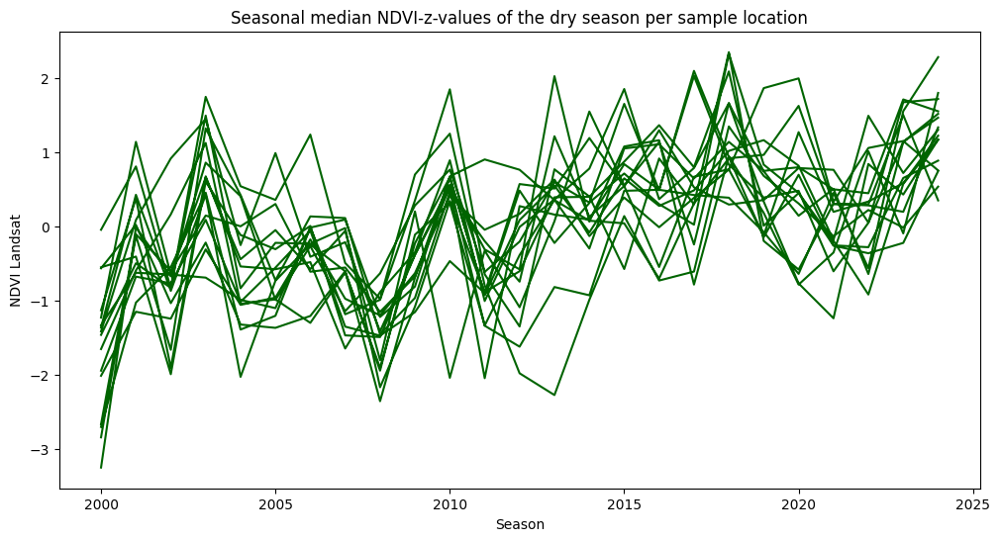

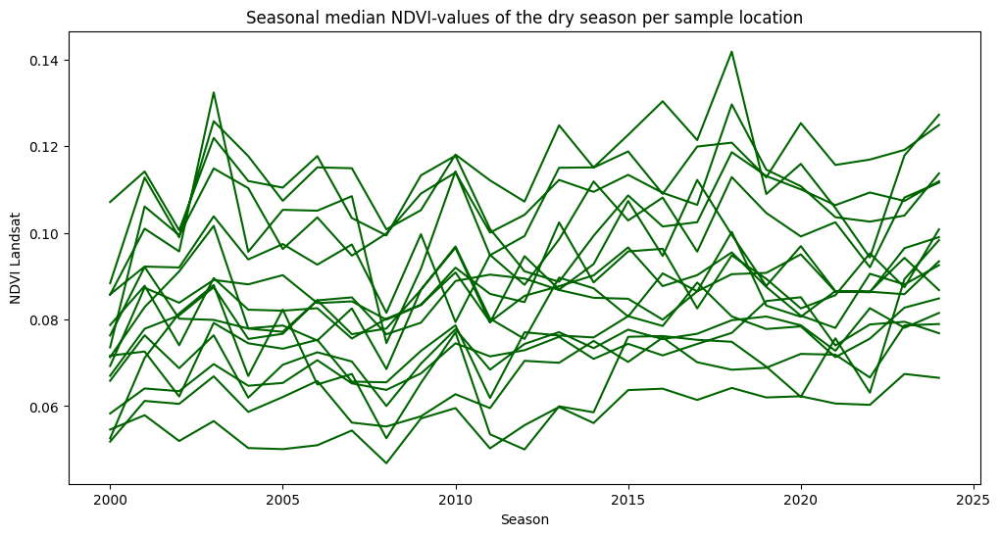

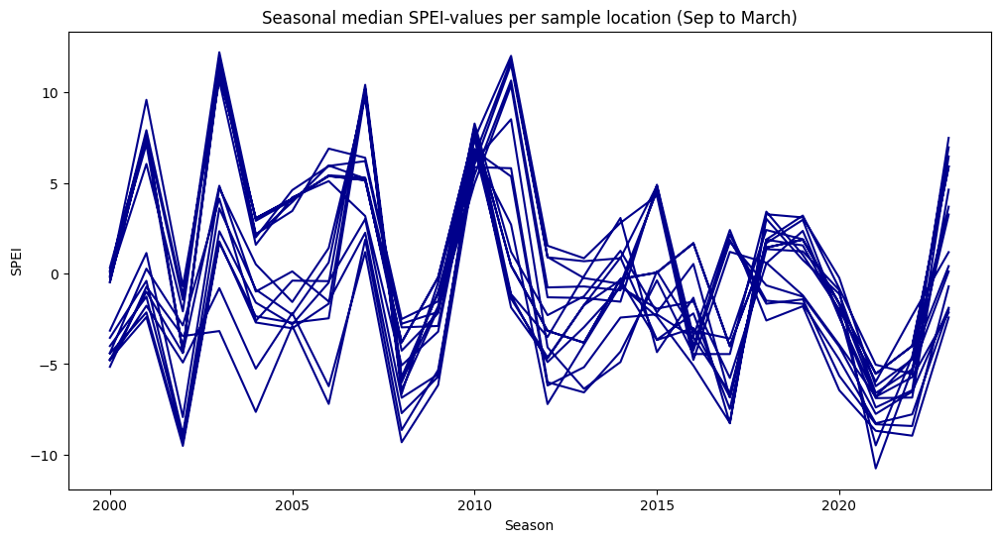

In [ ]:
# Plot NDVI-medians (Dec to March)
plt.figure(figsize=(12, 6))

plt.plot(subandean_grasslands_seasonal["season"], subandean_grasslands_seasonal["NDVI_zvalues"], color = "darkgreen")
plt.xlabel("Season")
plt.ylabel("NDVI Landsat")
plt.title("Seasonal median NDVI-z-values of the dry season per sample location")
plt.show()

# Plot NDVI-medians (Dec to March)
plt.figure(figsize=(12, 6))

plt.plot(subandean_grasslands_seasonal["season"], subandean_grasslands_seasonal["Median_NDVI_Dec_to_Mar"], color = "darkgreen")
plt.xlabel("Season")
plt.ylabel("NDVI Landsat")
plt.title("Seasonal median NDVI-values of the dry season per sample location")
plt.show()

# Plot medians of SPEI-sums (Sep to Mar)
plt.figure(figsize=(12, 6))

plt.plot(subandean_grasslands_seasonal["season"], subandean_grasslands_seasonal["SPEI_Sep_to_Mar"],  color = "darkblue")
plt.xlabel("Season")
plt.ylabel("SPEI")
plt.title("Seasonal median SPEI-values per sample location (Sep to March)")
plt.show()

**NDVI as lines and SPEI as bars.**

#### Per sample location

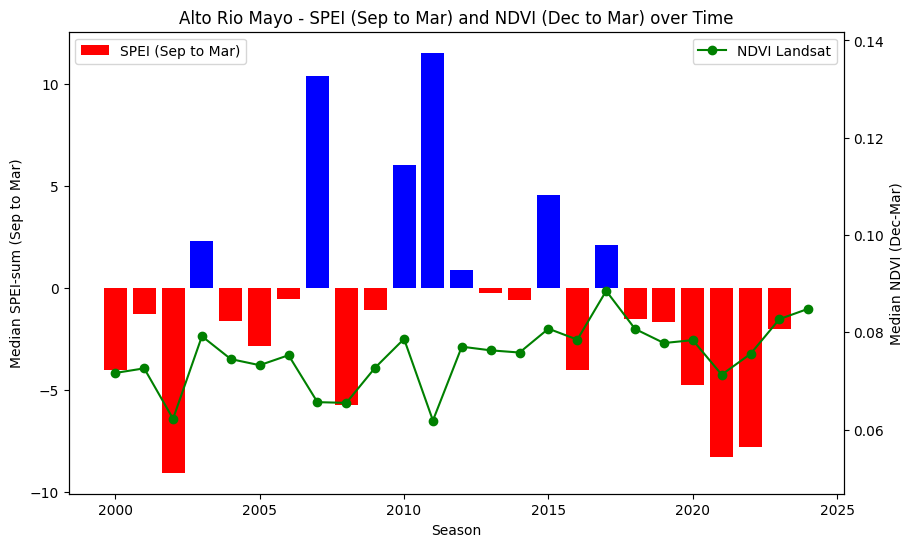

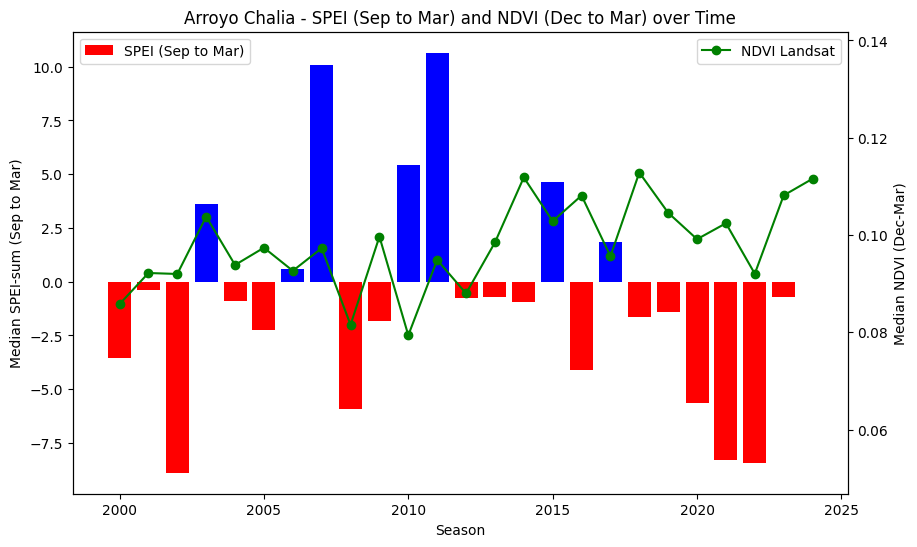

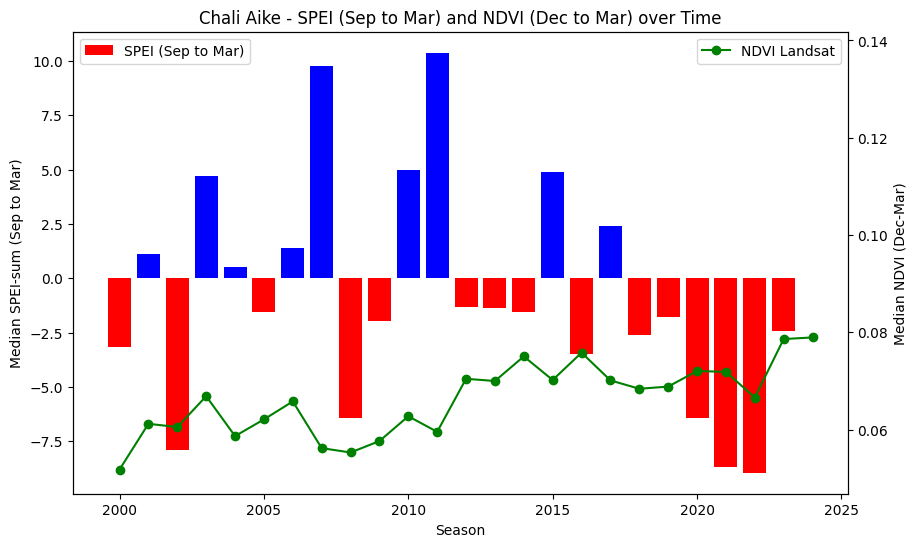

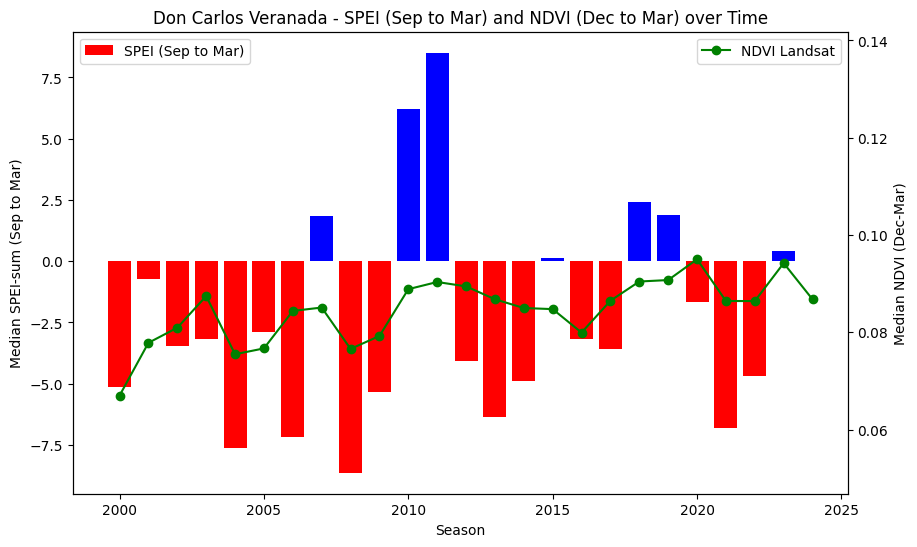

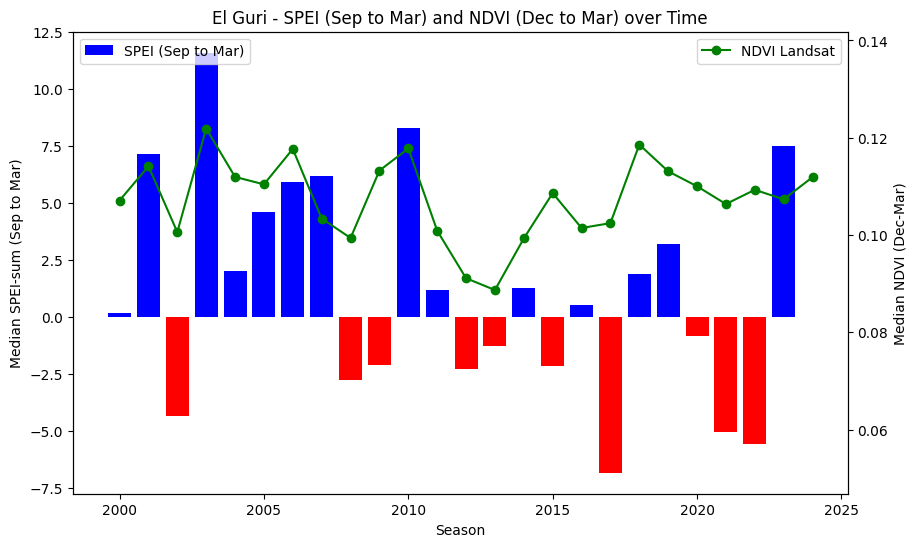

...

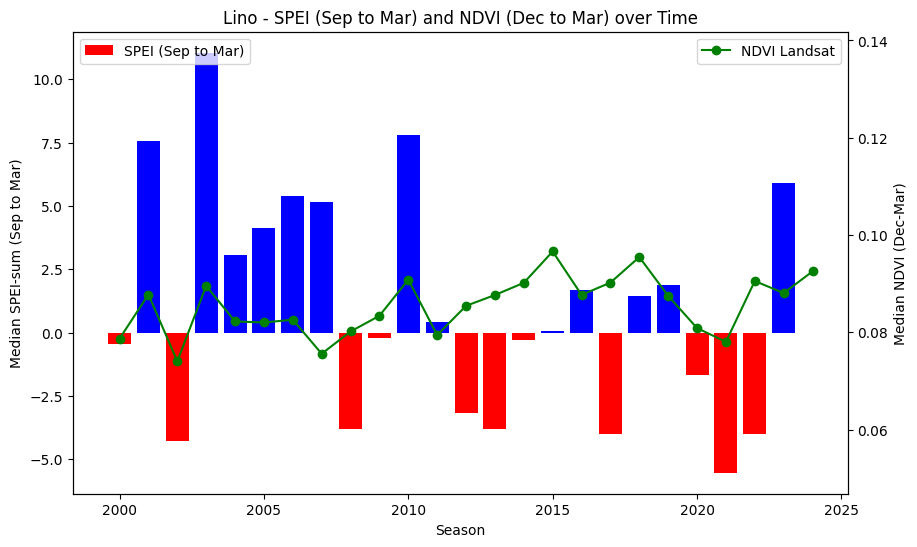

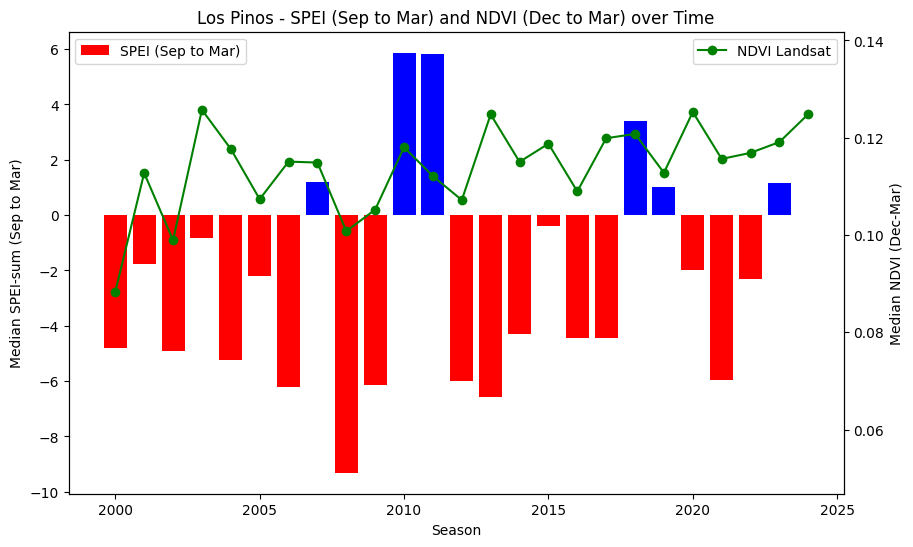

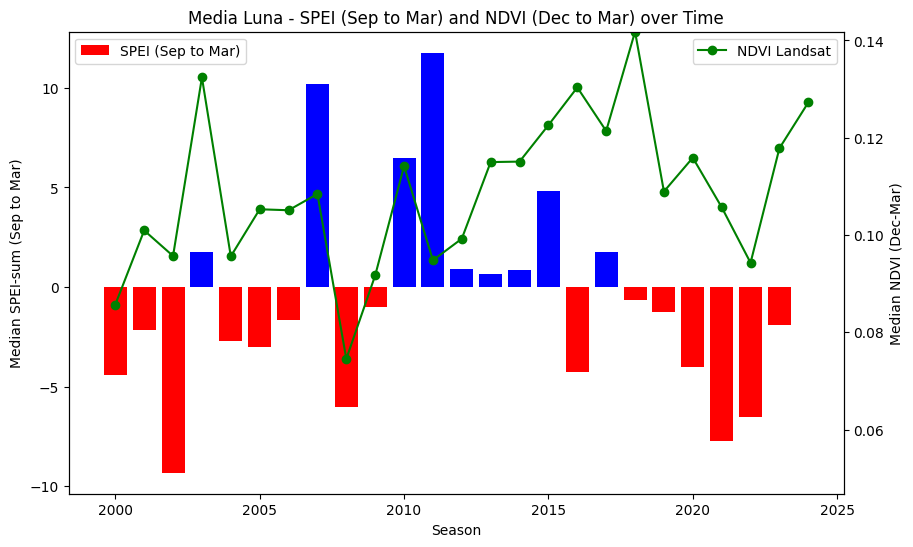

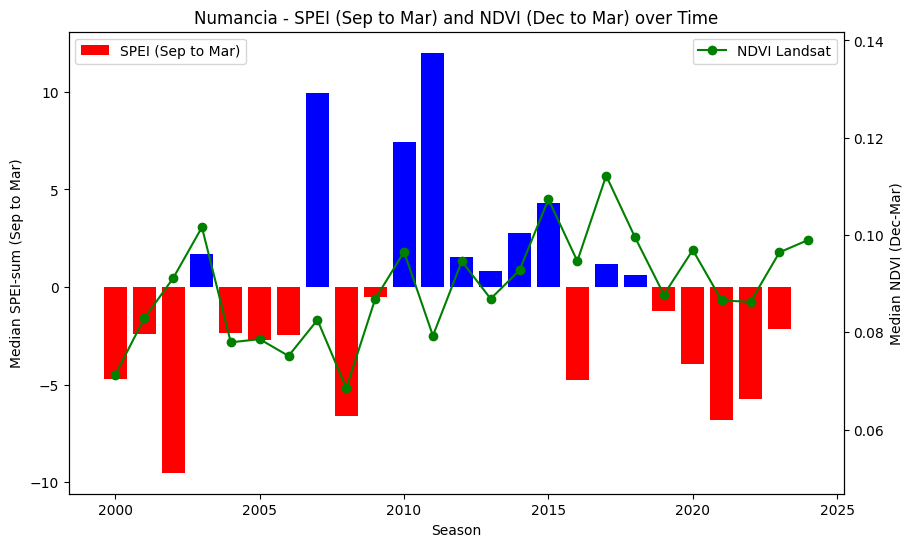

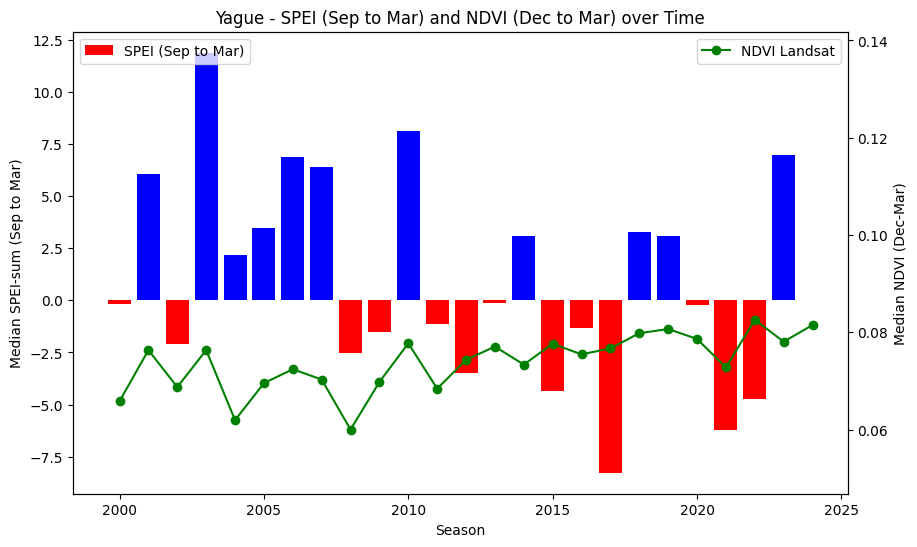

In [ ]:
ndvi_min = min(subandean_grasslands_seasonal['Median_NDVI_Dec_to_Mar'])
ndvi_max = max(subandean_grasslands_seasonal['Median_NDVI_Dec_to_Mar'])

# Iterate over each site and create the plot
for site, group in subandean_grasslands_seasonal.groupby('Site_Name'):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot SPEI as bars
    ax1.bar(
        group['season'],
        group['SPEI_Sep_to_Mar'],
        color=['blue' if x >= 0 else 'red' for x in group['SPEI_Sep_to_Mar']],
        label='SPEI (Sep to Mar)'
    )
    ax1.set_xlabel('Season')
    ax1.set_ylabel('Median SPEI-sum (Sep to Mar)')

    # Set up secondary y-axis for NDVI_Landsat
    ax2 = ax1.twinx()
    ax2.plot(
        group['season'],
        group['Median_NDVI_Dec_to_Mar'],
        color='green',
        marker='o',
        linestyle='-',
        label='NDVI Landsat'
    )
    ax2.set_ylabel('Median NDVI (Dec-Mar)')

    # Set consistent y-axis limits for NDVI across all plots for comparability
    ax2.set_ylim(ndvi_min, ndvi_max)

    # Title and legends
    plt.title(f'{site} - SPEI (Sep to Mar) and NDVI (Dec to Mar) over Time')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')

    # Show plot for each site
    plt.show()

#### Across sample locations PDF

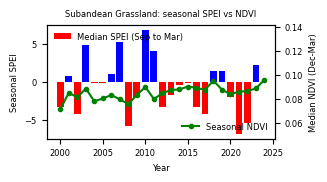

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/Subandean_grasslands_Correlation/Subandean_grasslands_LineBars.pdf


In [ ]:
# Define the folder to save the plots
save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/Subandean_grasslands_Correlation'
file_path = os.path.join(save_path, f"Subandean_grasslands_LineBars.pdf")

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)


# Calculate median values per season across all sites
median_values = subandean_grasslands_seasonal.groupby('season').median(numeric_only=True).reset_index()

# Plotting
fig, ax1 = plt.subplots(figsize=(2.9/2.54*2, 2.9/2.54))

# Plot SPEI as bars with positive values in blue and negative in red
ax1.bar(
    median_values['season'],
    median_values['SPEI_Sep_to_Mar'],
    color=['blue' if x >= 0 else 'red' for x in median_values['SPEI_Sep_to_Mar']],
    label='Median SPEI (Sep to Mar)'
)
ax1.set_xlabel('Year', fontsize = 6)
ax1.set_ylabel('Seasonal SPEI', fontsize = 6)
ax1.tick_params(axis='y', labelsize=6)
ax1.tick_params(axis='x', labelsize=6)

# Set up secondary y-axis for NDVI_Landsat
ax2 = ax1.twinx()
ax2.plot(
    median_values['season'],
    median_values['Median_NDVI_Dec_to_Mar'],
    color='green',
    marker='o',
    linestyle='-',
    label='Seasonal NDVI',
    markersize = 3
)
ax2.set_ylabel('Median NDVI (Dec-Mar)', fontsize = 6)
ax2.tick_params(axis='y', labelsize=6)


# Set consistent y-axis limits for NDVI across all plots for comparability
ax2.set_ylim(ndvi_min, ndvi_max)

# Title and Legends
plt.title('Subandean Grassland: seasonal SPEI vs NDVI', fontsize = 6)
ax1.legend(loc='upper left', fontsize = 6, frameon=False)
ax2.legend(loc='lower right', fontsize = 6, frameon=False)

# Remove extra space: explicitly set axes position
ax2.set_position([0, 0, 1, 1])  # Fill the entire figure area


# Save plot
plt.show()
fig.savefig(file_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0)
plt.close(fig)
print(f"Figure saved to {file_path}")


#### Save median values as as csv

In [ ]:
# Define the folder to save the plots
save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/Subandean_grasslands_Correlation'
file_path = os.path.join(save_path, f"Subandean_grasslands_LineBars.csv")

median_values.to_csv(file_path, index=False)

Correlation coefficient

Correlation coefficient: 0.22
P-value: 0.2948


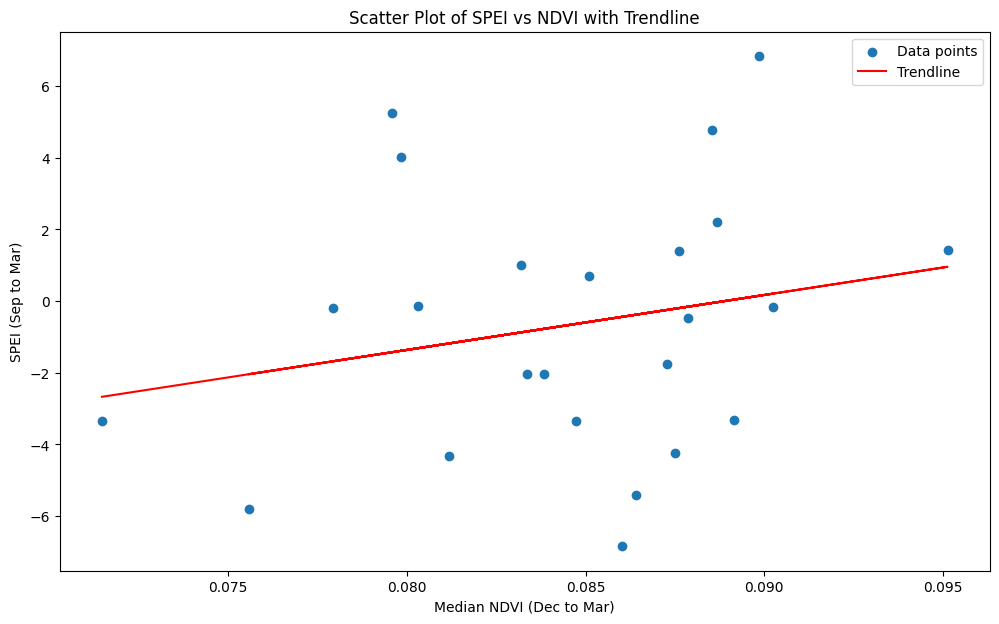

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import numpy as np

# Remove rows with NaN or inf values from the two columns
cleaned_data = median_values[['SPEI_Sep_to_Mar', 'Median_NDVI_Dec_to_Mar']].dropna()
cleaned_data = cleaned_data[~cleaned_data.isin([float('inf'), float('-inf')]).any(axis=1)]

# Calculate the Pearson correlation coefficient and p-value
correlation_coefficient, p_value = stats.pearsonr(
    cleaned_data['SPEI_Sep_to_Mar'], cleaned_data['Median_NDVI_Dec_to_Mar']
)

# Print the results
print(f"Correlation coefficient: {correlation_coefficient:.2f}")
print(f"P-value: {p_value:.4f}")

# Plotting: Scatter plot of SPEI vs NDVI
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(
    cleaned_data['Median_NDVI_Dec_to_Mar'], cleaned_data['SPEI_Sep_to_Mar'], label="Data points"
)

# Fit a linear regression (trendline)
slope, intercept = np.polyfit(cleaned_data['Median_NDVI_Dec_to_Mar'], cleaned_data['SPEI_Sep_to_Mar'], 1)
trendline = slope * cleaned_data['Median_NDVI_Dec_to_Mar'] + intercept

# Plot the trendline
ax.plot(cleaned_data['Median_NDVI_Dec_to_Mar'], trendline, color='red', label='Trendline')

# Labeling and title
ax.set_xlabel('Median NDVI (Dec to Mar)')
ax.set_ylabel('SPEI (Sep to Mar)')
ax.set_title('Scatter Plot of SPEI vs NDVI with Trendline')
ax.legend()

plt.show()


## SPEI-values as bar plot (Sep to Mar)

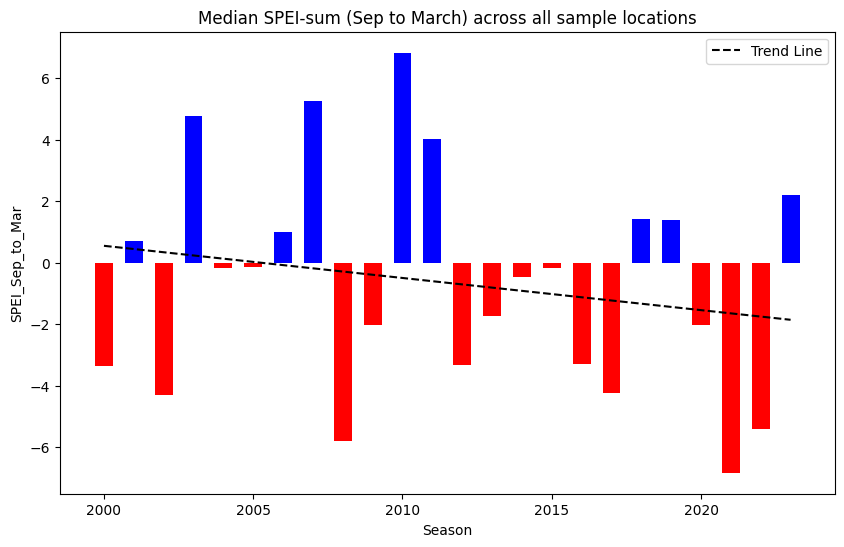

Slope per month: -0.1
Intercept: 0.55
R-value: -0.2
P-value of the slope: 0.34
Standard error: 0.11
Slope per year: -1.3


In [ ]:
# Step 1: Group by season and calculate median values using SPEI_Sep_to_Mar
seasonal_medians = subandean_grasslands_seasonal.groupby("season").agg({
    "SPEI_Sep_to_Mar": "median"
}).reset_index()

# Drop NAs
non_na_seasonal_medians = seasonal_medians.dropna(subset=["SPEI_Sep_to_Mar"])

# Step 2: Create the plot with a single y-axis for SPEI_Sep_to_Mar
fig, ax1 = plt.subplots(figsize=(10, 6))

# Step 3: Plot SPEI_Sep_to_Mar as bars
colors = np.where(non_na_seasonal_medians["SPEI_Sep_to_Mar"] >= 0, 'blue', 'red')
ax1.bar(non_na_seasonal_medians["season"], non_na_seasonal_medians["SPEI_Sep_to_Mar"], color=colors, width=0.6)
ax1.set_xlabel('Season')
ax1.set_ylabel('SPEI_Sep_to_Mar', color='black')
ax1.tick_params(axis='y')

# Step 4: Add a trend line
x = np.arange(len(non_na_seasonal_medians))  # Create a sequence of numbers for seasons
y = non_na_seasonal_medians["SPEI_Sep_to_Mar"].values
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
trend_line = slope * x + intercept

ax1.plot(non_na_seasonal_medians["season"], trend_line, color='black', linestyle='--', label='Trend Line')

# Step 5: Add a title and legend, then show the plot
plt.title('Median SPEI-sum (Sep to March) across all sample locations')
plt.legend()
plt.show()

# Print the slope, intercept, p-value, and standard error
print("Slope per month:", f"{slope:.2g}")
print("Intercept:",  f"{intercept:.2g}")
print("R-value:",  f"{r_value:.2g}")
print("P-value of the slope:",  f"{p_value:.2g}")
print("Standard error:",  f"{std_err:.2g}")
slope_per_year = slope * 12
print("Slope per year:", f"{slope_per_year:.2g}")

## NDVI-values as line plot

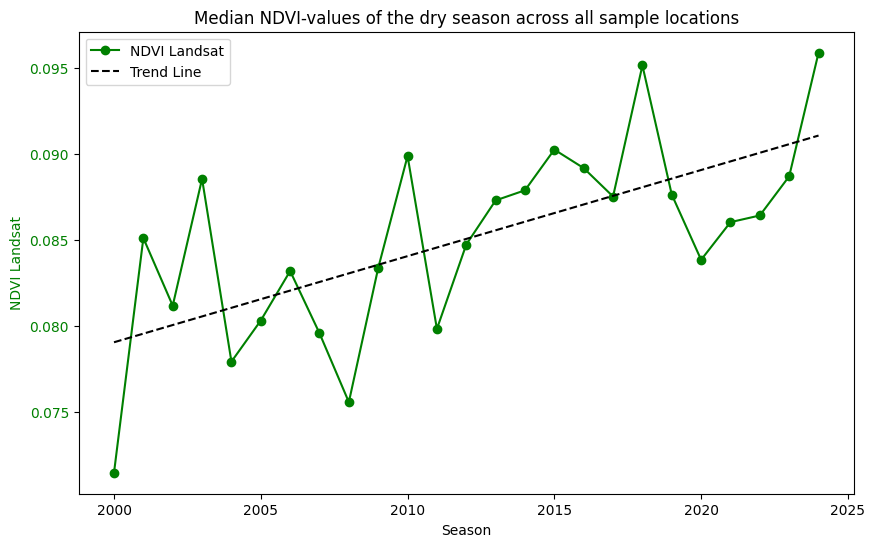

Slope per month: 0.0005
Intercept: 0.079
R-value: 0.65
P-value of the slope: 0.00042
Standard error: 0.00012
Slope per year: 0.006


In [ ]:
# Step 1: Group by season and calculate median values
seasonal_medians = subandean_grasslands_seasonal.groupby("season").agg({
    "Median_NDVI_Dec_to_Mar": "median"
}).reset_index()

# Drop NAs
non_na_seasonal_medians = seasonal_medians.dropna(subset=["Median_NDVI_Dec_to_Mar"])

# Step 2: Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Step 3: Plot the NDVI Landsat line
ax.plot(seasonal_medians["season"], seasonal_medians["Median_NDVI_Dec_to_Mar"], color='green', marker='o', linestyle='-', label='NDVI Landsat')

# Step 4: Add a trendline using linregress
x = np.arange(len(non_na_seasonal_medians))  # Create a sequence of numbers for seasons
y = non_na_seasonal_medians["Median_NDVI_Dec_to_Mar"].values
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
trend_line = slope * x + intercept

# Plot the trendline on the same axis (ax)
ax.plot(non_na_seasonal_medians["season"], trend_line, color='black', linestyle='--', label='Trend Line')

# Step 5: Set labels and title
ax.set_xlabel('Season')
ax.set_ylabel('NDVI Landsat', color='green')
ax.tick_params(axis='y', labelcolor='green')

# Add a title and legend
plt.title('Median NDVI-values of the dry season across all sample locations')
ax.legend()

# Show the plot
plt.show()

# Print the slope, intercept, p-value, and standard error
print("Slope per month:", f"{slope:.2g}")
print("Intercept:",  f"{intercept:.2g}")
print("R-value:",  f"{r_value:.2g}")
print("P-value of the slope:",  f"{p_value:.2g}")
print("Standard error:",  f"{std_err:.2g}")
slope_per_year = slope * 12
print("Slope per year:", f"{slope_per_year:.2g}")

## Merge the two plots

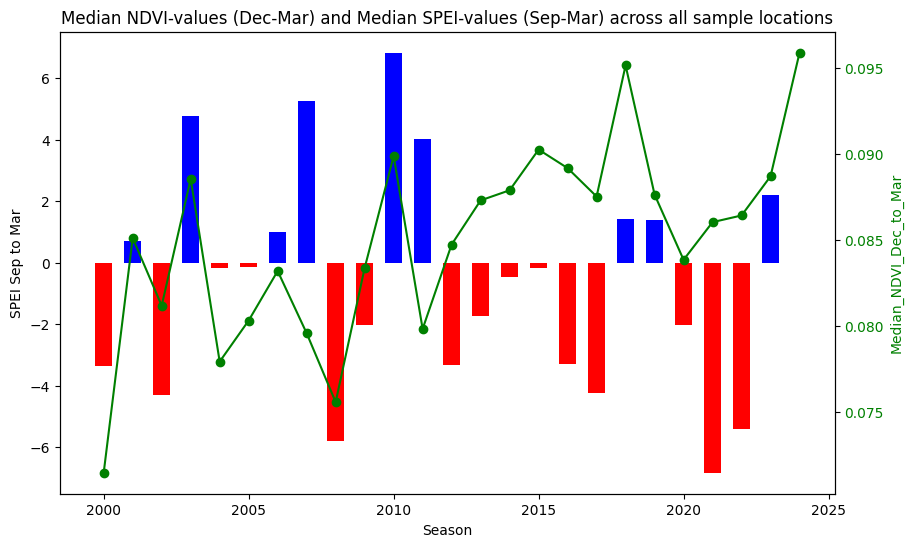

In [ ]:
# Step 1: Group by season and calculate median values for NDVI_Landsat and SPEI_Sep_to_Mar
seasonal_medians = subandean_grasslands_seasonal.groupby("season").agg({
    "Median_NDVI_Dec_to_Mar": "median",
    "SPEI_Sep_to_Mar": "median"
}).reset_index()

# Step 2: Create the plot with two y-axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Step 3: Plot SPEI_Sep_to_Mar as bars (left y-axis)
colors = np.where(seasonal_medians["SPEI_Sep_to_Mar"] >= 0, 'blue', 'red')
ax1.bar(seasonal_medians["season"], seasonal_medians["SPEI_Sep_to_Mar"], color=colors, width=0.6)
ax1.set_xlabel('Season')
ax1.set_ylabel('SPEI Sep to Mar', color='black')
ax1.tick_params(axis='y')

# Step 4: Create a second y-axis for NDVI_Landsat
ax2 = ax1.twinx()
ax2.plot(seasonal_medians["season"], seasonal_medians["Median_NDVI_Dec_to_Mar"], color='green', marker='o', linestyle='-', label='NDVI Landsat')
ax2.set_ylabel('Median_NDVI_Dec_to_Mar', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Step 5: Add a title and show the plot
plt.title('Median NDVI-values (Dec-Mar) and Median SPEI-values (Sep-Mar) across all sample locations')

# Show the plot
plt.show()


# NDVI and SPEI (Sep to Mar) per sample locations

## Function to plot SPEI and NDVI

for a given site with suncronized y-axes

In [ ]:
def plot_spei_ndvi(data, site_name, y1_min, y1_max, y2_min, y2_max):

    # Define the folder to save the plots
    save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_DrySeason/'
    file_path = os.path.join(save_path, f"{site_name}_lineBars.pdf")

    # Create the directory if it doesn't exist
    os.makedirs(save_path, exist_ok=True)

    site_data = data[data["Site_Name"] == site_name]

    # Check for missing data
    if site_data.empty:
        print(f"Warning: No data available for site {site_name}")
        return

    seasonal_medians = site_data.groupby("season").agg({
        "Median_NDVI_Dec_to_Mar": "median",
        "SPEI_Sep_to_Mar": "median"
    }).reset_index()

    # Calculate statistics for SPEI and NDVI
    spei_median = seasonal_medians["SPEI_Sep_to_Mar"].median()
    spei_max = seasonal_medians["SPEI_Sep_to_Mar"].max()
    spei_min = seasonal_medians["SPEI_Sep_to_Mar"].min()

    ndvi_median = seasonal_medians["Median_NDVI_Dec_to_Mar"].median()
    ndvi_max = seasonal_medians["Median_NDVI_Dec_to_Mar"].max()
    ndvi_min = seasonal_medians["Median_NDVI_Dec_to_Mar"].min()

    # Remove rows with NaN or inf values from seasonal_medians
    seasonal_medians = seasonal_medians.replace([np.inf, -np.inf], np.nan).dropna()


    # Print statistics
    print(f"Statistics for {site_name}:")
    print(f"  Median SPEI: {spei_median}")
    print(f"  Maximum SPEI: {spei_max}")
    print(f"  Minimum SPEI: {spei_min}")
    print(f"  Median NDVI: {ndvi_median}")
    print(f"  Maximum NDVI: {ndvi_max}")
    print(f"  Minimum NDVI: {ndvi_min}")
    print("-" * 50)

    # Calculate Pearson correlation coefficient and p-value
    correlation_coefficient, p_value = stats.pearsonr(
        seasonal_medians["SPEI_Sep_to_Mar"], seasonal_medians["Median_NDVI_Dec_to_Mar"]
    )
    print(f"Pearson correlation coefficient: {correlation_coefficient:.2f}")
    print(f"P-value: {p_value:.4f}")
    print("-" * 50)

    # Plot setup
    fig = plt.figure(figsize=(2.9/2.54*2, 2.9/2.54*1))  # Convert cm to inches
    ax1 = fig.add_subplot(111)
    colors = np.where(seasonal_medians["SPEI_Sep_to_Mar"] >= 0, '#1f77b4', '#d62728')
    ax1.bar(seasonal_medians["season"], seasonal_medians["SPEI_Sep_to_Mar"], color=colors, width=0.6)
    ax1.set_xlabel('Season', fontsize = 6)
    ax1.set_ylabel('SPEI (Sep-Mar)', color='black', fontsize = 6)
    ax1.tick_params(axis='y', labelsize = 6, width = 0.5)

    # Modify x-axis ticks
    seasons = seasonal_medians["season"]
    ax1.set_xticks(seasons)
    ax1.set_xticklabels(['' if i % 5 != 0 else season for i, season in enumerate(seasons)], rotation=45, ha='right', fontsize=6)
    ax1.tick_params(axis='x', which='both', length=3, labelsize=6)  # Default tick length

    # Set fixed y-axis limits for SPEI (left y-axis)
    ax1.set_ylim(y1_min, y1_max)

    # Remove extra space: explicitly set axes position
    ax1.set_position([0, 0, 1, 1])  # Fill the entire figure area

    # Make a right y axis
    ax2 = ax1.twinx()
    ax2.plot(seasonal_medians["season"], seasonal_medians["Median_NDVI_Dec_to_Mar"],
             color='green', marker='o', linestyle='-', label='NDVI Landsat', markersize = 3)
    ax2.set_ylabel('Median NDVI (Dec-Mar)', color='green', fontsize = 6)
    ax2.tick_params(axis='y', labelcolor='green', width = 0.5, labelsize = 6)

    # Set fixed y-axis limits for NDVI (right y-axis)
    ax2.set_ylim(y2_min, y2_max)
    ax2.legend(loc='upper right', frameon=False, fontsize = 6)

    # Remove extra space: explicitly set axes position
    ax2.set_position([0, 0, 1, 1])  # Fill the entire figure area

    # Add title
    plt.title(f'SPEI-sum (Sep-Mar) and NDVI-medians (Dec-Mar) for {site_name}', fontsize = 6)

    # Save plot
    plt.show()
    fig.savefig(file_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0)
    plt.close(fig)
    print(f"Figure saved to {file_path}")


In [ ]:
subandean_grasslands_seasonal["Site_Name"].unique()

array(['Alto Rio Mayo', 'Arroyo Chalia', 'Chali Aike',
       'Don Carlos Veranada', 'El Guri', 'El Maiten', 'El Zaino',
       'La Cancha', 'La Paulina', 'La Paulina y Avelino', 'Lago Vintter',
       'Lino', 'Los Pinos', 'Media Luna', 'Numancia', 'Yague'],
      dtype=object)

## Generate the plots

Statistics for El Guri:
  Median SPEI: 0.85926443
  Maximum SPEI: 11.58766764
  Minimum SPEI: -6.836904211
  Median NDVI: 0.108625
  Maximum NDVI: 0.12190000000000001
  Minimum NDVI: 0.0887
--------------------------------------------------
Pearson correlation coefficient: 0.54
P-value: 0.0061
--------------------------------------------------


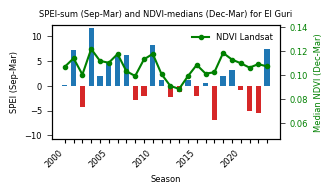

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_DrySeason/El Guri_lineBars.pdf
Statistics for Don Carlos Veranada:
  Median SPEI: -3.3136725824999997
  Maximum SPEI: 8.5099907
  Minimum SPEI: -8.6355252
  Median NDVI: 0.086425
  Maximum NDVI: 0.095025
  Minimum NDVI: 0.067
--------------------------------------------------
Pearson correlation coefficient: 0.49
P-value: 0.0158
--------------------------------------------------


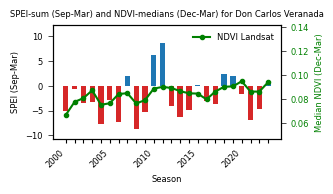

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_DrySeason/Don Carlos Veranada_lineBars.pdf
Statistics for El Zaino:
  Median SPEI: -0.725755957
  Maximum SPEI: 10.6273695
  Minimum SPEI: -6.87656971
  Median NDVI: 0.0691
  Maximum NDVI: 0.0983
  Minimum NDVI: 0.05
--------------------------------------------------
Pearson correlation coefficient: 0.47
P-value: 0.0199
--------------------------------------------------


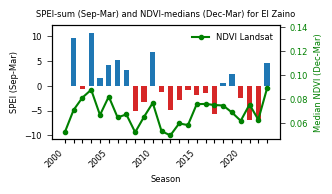

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_DrySeason/El Zaino_lineBars.pdf


In [ ]:
# Define the site names to be plotted:
site_name = ["El Guri", "Don Carlos Veranada", "El Zaino"]

# Find the overall min and max for both y-axes
y1_min = subandean_grasslands_seasonal["SPEI_Sep_to_Mar"].min()
y1_max = subandean_grasslands_seasonal["SPEI_Sep_to_Mar"].max()
y2_min = subandean_grasslands_seasonal["Median_NDVI_Dec_to_Mar"].min()
y2_max = subandean_grasslands_seasonal["Median_NDVI_Dec_to_Mar"].max()

# Loop over each site and generate plots with fixed y-axis scales
for site in site_name:
    plot_spei_ndvi(subandean_grasslands_seasonal, site, y1_min, y1_max, y2_min, y2_max)


# Correlation coefficients

## 2000 to 2024

### Per sample location (2000-2024)

I correlate the median NDVI-values (Dec-Mar) with the medians of the  SPEI-sums (Sep to Nov and Sep to March, respectively).

In [ ]:
# Create an empty dictionary to store the correlation coefficients
correlations_sep_to_mar = {}

# Group the data by Site_Name and calculate correlation for each group
for site, group in subandean_grasslands_seasonal.groupby("Site_Name"):
    # Calculate the correlation between NDVI_Landsat and SPEI_Sep_to_Mar for the current site
    correlation_sep_to_mar = group["Median_NDVI_Dec_to_Mar"].corr(group["SPEI_Sep_to_Mar"])

    # Store the correlation coefficients in the dictionaries
    correlations_sep_to_mar[site] = correlation_sep_to_mar

# Convert the dictionaries to a DataFrame for easier viewing
correlation_2000_2024_per_location = pd.DataFrame({
    "Site_Name": correlations_sep_to_mar.keys(),
    "Corr_Sep_to_Mar": correlations_sep_to_mar.values()
})

# Sort the DataFrame in descending order by Corr_Sep_to_Mar
correlation_2000_2024_per_location = correlation_2000_2024_per_location.sort_values(
    by="Corr_Sep_to_Mar",
    ascending=False
)

# Display the sorted DataFrame with correlations
correlation_2000_2024_per_location

,Site_Name,Corr_Sep_to_Mar
4,El Guri,0.543182
3,Don Carlos Veranada,0.487151
6,El Zaino,0.472008
12,Los Pinos,0.348512
13,Media Luna,0.247850
14,Numancia,0.219944
11,Lino,0.208439
5,El Maiten,0.162071
9,La Paulina y Avelino,0.158972
10,Lago Vintter,0.147545


Import df "correlation_2000_2024_per_location" to my drive.

In [ ]:
output_path = '/content/drive/My Drive/correlation_2000_2024_per_location.csv'

# Export the DataFrame to the specified path
correlation_2000_2024_per_location.to_csv(output_path, index=False)

print(f"DataFrame successfully exported to {output_path}")

DataFrame successfully exported to /content/drive/My Drive/correlation_2000_2024_per_location.csv


## "Rolling" correlation (always 5 years)

Correlation between the median NDVI-values of the dry season (Dec-Mar) and
the

*   median SPEI-values of the three months previous to the dry season + the dry season (Sep-Mar)
*   median SPEI-values of the three months previous to the dry season (Sep-Nov)



### Per sample location (SPEI Sep to March)

In [ ]:
# Define the start and end years for each period
start_year = 2000
end_year = 2005
max_year = 2024

# Create an empty list to store all correlations across periods
all_correlations = []

# Iterate over the years to create rolling windows of time
while end_year <= max_year:
    # Filter the data for the current time window
    period_data = subandean_grasslands_seasonal[(subandean_grasslands_seasonal['season'] >= start_year) &
                                                (subandean_grasslands_seasonal['season'] <= end_year)]

    # Initialize a dictionary to store correlations for the current period
    period_correlations = {'Period': f'{start_year}-{end_year}'}

    # Group by 'Site_Name' and calculate correlation for each site in the current time period
    for site, group in period_data.groupby("Site_Name"):
        # Calculate the correlation between Median_NDVI_Dec_to_Mar and SPEI
        correlation = group["Median_NDVI_Dec_to_Mar"].corr(group["SPEI_Sep_to_Mar"])

        # Store the correlation coefficient in the dictionary under the site name
        period_correlations[site] = correlation

    # Append the dictionary with correlations for the current period to the list
    all_correlations.append(period_correlations)

    # Move the time window forward by one year
    start_year += 1
    end_year += 1

# Convert the list of dictionaries to a DataFrame for easier viewing
rolling_correlation_per_location_spei_sep_to_mar = pd.DataFrame(all_correlations)

# Display the DataFrame with correlations
rolling_correlation_per_location_spei_sep_to_mar

,Period,Alto Rio Mayo,Arroyo Chalia,Chali Aike,Don Carlos Veranada,El Guri,El Maiten,El Zaino,La Cancha,La Paulina,La Paulina y Avelino,Lago Vintter,Lino,Los Pinos,Media Luna,Numancia,Yague
0,2000-2005,0.976644,0.622823,0.496568,0.377246,0.970398,0.593767,0.471579,0.627759,0.388876,0.654568,0.908609,0.990069,0.588028,0.714766,0.260541,0.720338
1,2001-2006,0.983722,0.584178,0.565400,-0.019046,0.949402,0.627289,0.189107,0.696997,0.289782,0.446094,0.566081,0.981938,0.320543,0.738753,0.139537,0.688171
2,2002-2007,0.143143,0.528250,-0.133142,0.392847,0.760948,0.485877,0.381269,0.680827,0.079840,0.163448,0.459451,0.816672,0.307127,0.468026,0.003850,0.715866
3,2003-2008,-0.141697,0.645964,0.169570,0.516871,0.772158,0.478485,0.872244,0.918000,0.290071,0.544939,0.486287,0.561794,0.563017,0.539490,0.499100,0.944683
4,2004-2009,-0.328619,0.501857,0.029123,0.523768,0.313637,-0.211984,0.690683,0.000310,-0.215542,0.460534,0.079014,-0.168056,0.487107,0.623482,0.625726,0.649978
5,2005-2010,0.038409,0.097503,0.137548,0.729581,0.495569,0.189880,0.752077,0.332641,0.351760,0.761240,0.633659,0.357284,0.771920,0.706659,0.734081,0.811423
6,2006-2011,-0.289219,0.299963,0.172490,0.889018,0.514318,0.311920,0.790758,0.462631,0.483371,0.834133,0.727729,0.400605,0.716379,0.596871,0.534903,0.789068
7,2007-2012,-0.269945,0.345216,-0.061667,0.783213,0.547053,0.277820,0.869116,0.470791,0.592990,0.793673,0.433338,0.226704,0.914349,0.709492,0.333411,0.509493
8,2008-2013,-0.180107,0.078012,0.027477,0.697386,0.629716,0.483786,0.848018,0.429148,0.858449,0.181771,0.498902,0.500240,0.390037,0.477651,0.402666,0.534428
9,2009-2014,-0.683202,-0.405374,-0.521255,0.597929,0.625966,0.354995,0.817336,0.407753,0.835667,0.001286,0.266390,0.329713,0.133932,-0.137663,-0.353314,0.536458


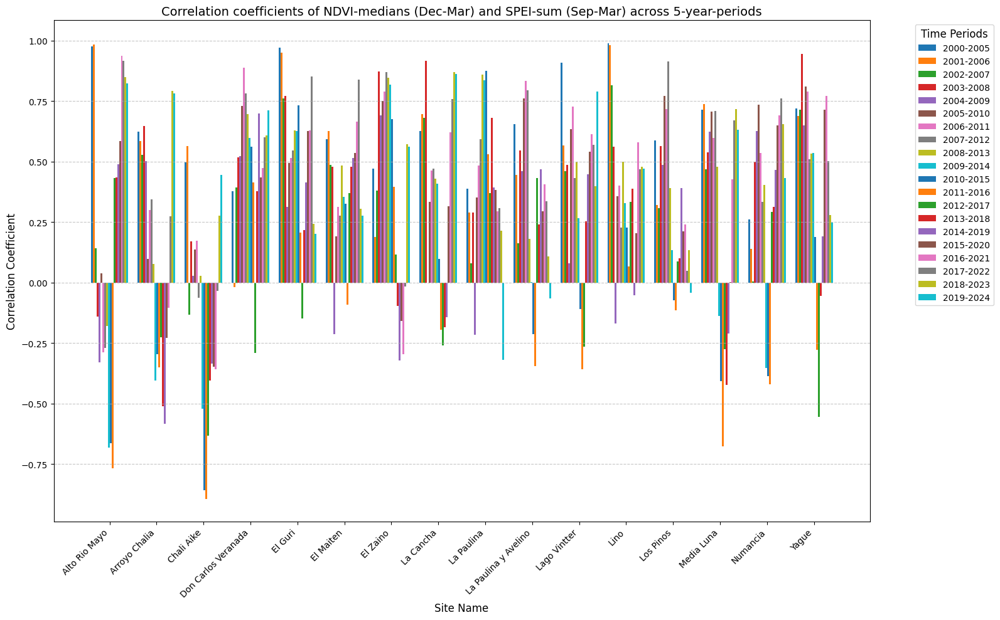

In [ ]:
# Sort the site names in alphabetical order for consistent ordering
sites = sorted([col for col in rolling_correlation_per_location_spei_sep_to_mar.columns if col != 'Period'])
time_periods = rolling_correlation_per_location_spei_sep_to_mar['Period']

# Set up the x-axis locations and bar width
x = np.arange(len(sites))  # the label locations for each site
width = 0.04  # Adjusted width of each bar

# Create a new figure with increased size for better readability
fig, ax = plt.subplots(figsize=(16, 10))

# Loop through each time period and plot each set of correlations
for i, period in enumerate(time_periods):
    # Retrieve the correlation values for this period, ordered by site
    correlations = rolling_correlation_per_location_spei_sep_to_mar.loc[i, sites]

    # Plot bars for this time period with an offset
    ax.bar(x + i * width, correlations, width, label=period)

# Set the x-axis labels and ticks with a larger font size
ax.set_xticks(x + width * (len(time_periods) - 1) / 2)  # center the ticks
ax.set_xticklabels(sites, rotation=45, ha='right', fontsize=10)

# Set x and y labels with larger fonts
ax.set_xlabel("Site Name", fontsize=12)
ax.set_ylabel("Correlation Coefficient", fontsize=12)

# Add grid lines for easier reading of correlation values
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add a title with a larger font size
ax.set_title("Correlation coefficients of NDVI-medians (Dec-Mar) and SPEI-sum (Sep-Mar) across 5-year-periods", fontsize=14)

# Move the legend outside the plot and increase font size for better readability
ax.legend(title="Time Periods", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, title_fontsize='12')

# Add spacing between each site location for readability
fig.tight_layout()

# Show the plot
plt.show()

#### Define plotting function

In [ ]:

# Function to plot correlation trends for a given location
def plot_correlation(data, location, y_min, y_max):

    # Define the folder to save the plots
    save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_CorrelationPlots/'
    file_path = os.path.join(save_path, f"{location}_CorPot.pdf")

    # Create the directory if it doesn't exist
    os.makedirs(save_path, exist_ok=True)


    correlation_values = data[location].values
    fig, ax = plt.subplots(figsize=(2.9/2.54*2, 2.9/2.54))
    ax.plot(
        data['Central_Year'],
        correlation_values,
        marker='o',
        linestyle='-',
        color='darkblue', markersize = 3,
        label=f'Correlation (Sep to Mar) - {location}'
    )
    ax.set_xlabel("Central Year", fontsize=6)
    ax.set_ylabel("Correlation Coefficient (Sep to Mar)", fontsize=6)
    ax.set_title(
        f"Correlation of NDVI (Dec to Mar) and SPEI (Sep to Mar)\nAcross 5-Year Periods in Subandean Grasslands - {location}",
        fontsize=6
    )

    ax.set_xticks(data['Central_Year'])
    # Remove ".5" from the end of the labels
    cleaned_labels = [str(year).replace('.5', '') for year in data['Central_Year']]
    ax.grid(axis='y', linestyle='--', alpha=0.7,  linewidth = 0.5)
    ax.tick_params(axis='y', labelsize=6)
    ax.set_xticklabels(cleaned_labels, rotation=45, ha='right', fontsize=6)

    # Apply synchronized y-axis limits
    ax.set_ylim(y_min, y_max)

    # Remove extra space: explicitly set axes position
    ax.set_position([0, 0, 1, 1])  # Fill the entire figure area

    # Save plot
    plt.show()
    fig.savefig(file_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0)
    plt.close(fig)
    print(f"Figure saved to {file_path}")



#### Plot individually

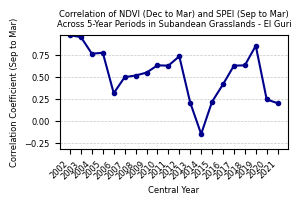

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_CorrelationPlots/El Guri_CorPot.pdf


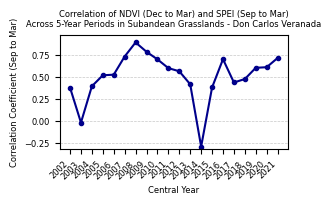

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_CorrelationPlots/Don Carlos Veranada_CorPot.pdf


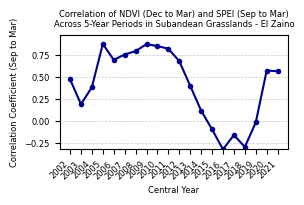

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/SPEIandNDVI_CorrelationPlots/El Zaino_CorPot.pdf


In [ ]:
# Extract the central years from the periods (e.g., "2000-2005" -> 2002.5)
rolling_correlation_per_location_spei_sep_to_mar['Central_Year'] = rolling_correlation_per_location_spei_sep_to_mar['Period'].apply(
    lambda x: (int(x.split('-')[0]) + int(x.split('-')[1])) / 2
)

# Plot for each location with synchronized y-axis limits
plot_locations = ["El Guri", "Don Carlos Veranada", "El Zaino"]

# Define y-axis limits for synchronized scaling across all locations
y_min = rolling_correlation_per_location_spei_sep_to_mar[plot_locations].min().min()  # Global minimum correlation
y_max = rolling_correlation_per_location_spei_sep_to_mar[plot_locations].max().max()  # Global maximum correlation

for location in plot_locations:
    plot_correlation(rolling_correlation_per_location_spei_sep_to_mar, location, y_min, y_max)


### Across sample locations: Sep to March


In [ ]:
# Define the start and end years for each period
start_year = 2000
end_year = 2005
max_year = 2024

# Create an empty list to store correlations and central years across periods for both SPEI variants
median_correlations_per_period = []

# Iterate over the years to create rolling windows of time
while end_year <= max_year:
    # Filter the data for the current time window
    period_data = subandean_grasslands_seasonal[
        (subandean_grasslands_seasonal['season'] >= start_year) &
        (subandean_grasslands_seasonal['season'] <= end_year)
    ]



    # Calculate the list of years for the period and determine the central year
    years_in_period = list(range(start_year, end_year + 1))
    central_year = years_in_period[len(years_in_period) // 2]  # Get the middle year
    print(years_in_period)
    # Initialize a dictionary to store the median correlations for the current period
    period_summary = {
        'Period': f'{start_year}-{end_year}',
        'central_year': central_year  # Add the central year
    }

    # Lists to store correlations for all sites within the current period for SPEI Sep to Mar
    correlations_sep_to_mar = []

    # Group by 'Site_Name' and calculate correlation for each site in the current time period
    for site, group in period_data.groupby("Site_Name"):
        # Calculate the correlation between NDVI_Landsat and SPEI_Sep_to_Mar
        correlation_sep_to_mar = group["Median_NDVI_Dec_to_Mar"].corr(group["SPEI_Sep_to_Mar"])
        if pd.notnull(correlation_sep_to_mar):
            correlations_sep_to_mar.append(correlation_sep_to_mar)

    # Calculate the median correlation for the current period across all sites for SPEI Sep to Mar
    period_summary['Median_Correlation_Sep_to_Mar'] = pd.Series(correlations_sep_to_mar).median()

    # Append the summary dictionary for the current period to the list
    median_correlations_per_period.append(period_summary)

    # Move the time window forward by one year
    start_year += 1
    end_year += 1

# Convert the list of dictionaries to a DataFrame for easier viewing
rolling_median_correlation_per_period = pd.DataFrame(median_correlations_per_period)

# Display the DataFrame with median correlations and central years for each period
rolling_median_correlation_per_period


[2000, 2001, 2002, 2003, 2004, 2005]
[2001, 2002, 2003, 2004, 2005, 2006]
[2002, 2003, 2004, 2005, 2006, 2007]
[2003, 2004, 2005, 2006, 2007, 2008]
[2004, 2005, 2006, 2007, 2008, 2009]
[2005, 2006, 2007, 2008, 2009, 2010]
[2006, 2007, 2008, 2009, 2010, 2011]
[2007, 2008, 2009, 2010, 2011, 2012]
[2008, 2009, 2010, 2011, 2012, 2013]
[2009, 2010, 2011, 2012, 2013, 2014]
[2010, 2011, 2012, 2013, 2014, 2015]
[2011, 2012, 2013, 2014, 2015, 2016]
[2012, 2013, 2014, 2015, 2016, 2017]
[2013, 2014, 2015, 2016, 2017, 2018]
[2014, 2015, 2016, 2017, 2018, 2019]
[2015, 2016, 2017, 2018, 2019, 2020]
[2016, 2017, 2018, 2019, 2020, 2021]
[2017, 2018, 2019, 2020, 2021, 2022]
[2018, 2019, 2020, 2021, 2022, 2023]
[2019, 2020, 2021, 2022, 2023, 2024]


,Period,central_year,Median_Correlation_Sep_to_Mar
0,2000-2005,2003,0.625291
1,2001-2006,2004,0.575130
2,2002-2007,2005,0.426149
3,2003-2008,2006,0.542214
4,2004-2009,2007,0.387085
5,2005-2010,2008,0.564614
6,2006-2011,2009,0.524610
7,2007-2012,2010,0.490142
8,2008-2013,2011,0.480718
9,2009-2014,2012,0.298051


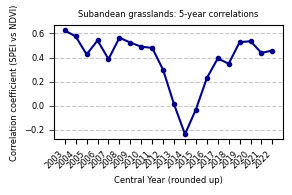

Figure saved to /content/drive/My Drive/ee-meinzinger-patagonia/Subandean_grasslands_Correlation/Subandean_grasslands_cor_plot.pdf


In [ ]:
# Define the folder to save the plots
save_path = '/content/drive/My Drive/ee-meinzinger-patagonia/Subandean_grasslands_Correlation'
file_path = os.path.join(save_path, f"Subandean_grasslands_cor_plot.pdf")

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Extract central years and median correlations
central_years = rolling_median_correlation_per_period['central_year'].astype(int)  # Convert to integers for cleaner display
median_correlations_sep_to_mar = rolling_median_correlation_per_period['Median_Correlation_Sep_to_Mar']

# Create the figure for a line plot
fig, ax = plt.subplots(figsize=(2.9/2.54*2, 2.9/2.54))

# Plot the median correlations over time
ax.plot(central_years, median_correlations_sep_to_mar, marker='o',
        linestyle='-', color='darkblue', label='Median Correlation (Sep to Mar)',
        markersize=3)


# Set x and y labels with larger fonts
ax.set_xlabel("Central Year (rounded up)", fontsize=6)
ax.set_ylabel("Correlation coefficient (SPEI vs NDVI)", fontsize=6)

# Add a title with a larger font size
ax.set_title("Subandean grasslands: 5-year correlations", fontsize=6)

# Set x-ticks as integers and rotate labels for readability
ax.set_xticks(central_years)
ax.set_xticklabels(central_years, rotation=45, ha='right', fontsize=6)
ax.tick_params(axis='y', labelsize=6, width=0.5)

# Add grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Remove extra space: explicitly set axes position
ax.set_position([0, 0, 1, 1])  # Fill the entire figure area

# Save plot
plt.show()
fig.savefig(file_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0)
plt.close(fig)
print(f"Figure saved to {file_path}")


Für die visuelle Breakpointeinteilung nehmen wir jeweils die Mittelwerte für


1.   2007 bis 2012 = 2010 ; d.h. **2000 bis 2010**
2.   2013 bis 2018 = 2016 ; d.h. **2011 bis 2016**
3.   **ab 2017**





